This pipeline opens the result of fsl's melodic analysis, lets the user interactively label the components that look like neuronal activity (rather than movement artefacts or noise), sort them by label, plots a final summary for the chosen components, and save the reordered maps and time series.

In [307]:
clear all

In [308]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
import scipy.io as sio
%matplotlib inline 
import pylab
import csv
from Tkinter import Tk
from tkFileDialog import askopenfilename
from tkFileDialog import askdirectory
import nibabel as nb
from scipy import io
import nibabel as nb

Open time series

In [309]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/sophie/100051/100051ss1_1000regcdFF20spsfkf129Smith0_4_60TS.mat


In [310]:
Ua=sio.loadmat(filename)
DT=Ua['TSo']
DT.shape

(11571, 129)

Open maps

In [311]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/media/sophie/100051/100051ss1_1000regcdFF20spsfkf129Smith0_4_60IC.nii


In [312]:
img1 = nb.load(filename2)
data = img1.get_data()
S=data.shape
S

(92, 44, 10, 129)

# Open time

In [313]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/sophie/100051/100051/100051TimeOn.mat


In [232]:
Time_fluo=np.array(range(11409))*0.005

In [314]:
Ua=sio.loadmat(filename)
Time_fluo=Ua['Time']
Time_fluo.shape

(11571, 1)

# Stimulus time series

In [315]:
Tmax=np.max(Time_fluo)
Tstim=np.array(range(1,100*(int(Tmax)+1)))
Tstim=Tstim/100
Odor=np.zeros(len(Tstim*100))
UV=np.zeros(len(Tstim*100))

In [316]:
for i in range(0,7):
    UV[10*100+i*600:100*10+i*600+300]=1
    
for i in range(0,5):    
    Odor[(10+8*6+15)*100+i*600:(10+8*6+15)*100+i*600+200]=1
UV[UV==0]=np.nan
Odor[Odor==0]=np.nan

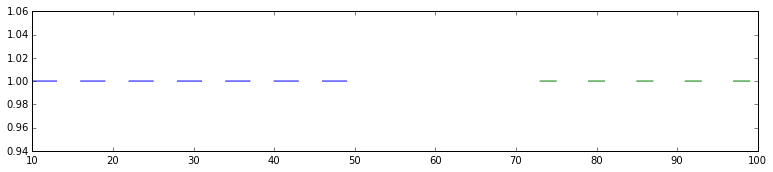

In [98]:
plt.plot(Tstim,UV)
plt.plot(Tstim,Odor)

# Behavior

* Cut the behavior movies to keep only frames with excitation on
* Analyze the behavior by hand (using Video_annotate) or measuring the ball movement with PIV (in FIJI)
* Extract time embedded in the movies, using avi2time

In [17]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)
B=sio.loadmat(filename)

/media/Seagate Backup Plus Drive/964/964vid/matlab.mat


In [92]:
Tb=B['T'].T
Left=B['green'].T
Right=B['blue'].T
Leftn=Left/np.max(Left)
Rightn=Left/np.max(Right)
Leftb=Leftn
Leftb[Leftn>0.2]=1
Leftb[Leftn<0.2]=np.nan
Rightb=Rightn
Rightb[Rightn>0.2]=1
Rightb[Rightn<0.2]=np.nan

In [93]:
Left.shape

(12117, 1)

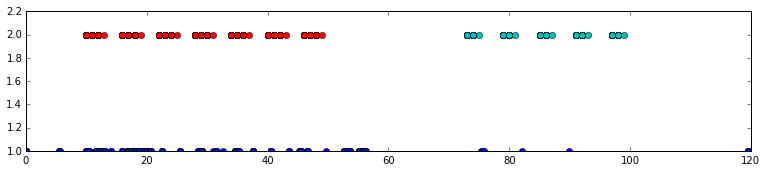

In [103]:
plt.plot(Tb,Rightb, marker='o')
plt.plot(Tb,Leftb)
plt.plot(Tstim,UV+1, marker='o')
plt.plot(Tstim,Odor+1,marker='o')

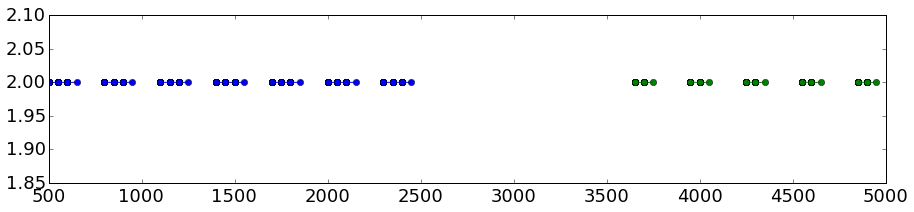

In [170]:
pylab.rcParams['figure.figsize'] = (15, 3)
plt.plot(Tstim/0.02,UV+1, marker='o')
plt.plot(Tstim/0.02,Odor+1,marker='o')

In [22]:
%store

Stored variables and their in-db values:


# Zscore maps

In [317]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

Transform the maps to have zero mean

In [318]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

Transform the maps to have unit variance and zscore

In [319]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2
    Tvar[i]=np.var(DT[i,:])
Dmaps[Dmaps<0]=0

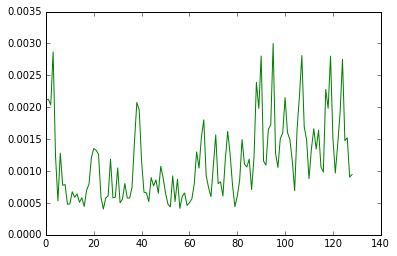

In [320]:
plt.plot(Tvar,'g')
#plt.plot(Var)

Order ICs by variance before normalization if ICA done in matlab

In [321]:
Order=np.argsort(Var)[::-1]
datao=data[:,:,:,Order[:]]
Dmapso=Dmaps[:,:,:,Order[:]]
Varor=Var[Order]

# Open time series from ROI and unmixed in ROI

In [238]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)
B=sio.loadmat(filename)

IOError: [Errno 2] No such file or directory: '.mat'

In [194]:
TS_ROI=B['TSzmapo']

In [322]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (13, 2.5)

In [323]:
Dtemp=np.mean(data,3)

In [324]:
Dtemp.shape

(92, 44, 10)

In [325]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

<IPython.core.display.Javascript object>

In [326]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenamet = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenamet)
imgt = nb.load(filenamet)
Dtemp=np.squeeze(imgt.get_data())

/media/sophie/100051/100051/100051ss1_1000regctemppsf.nii


In [327]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=np.squeeze(data[:,:,range(Nstack),2])
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

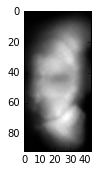

In [328]:
plt.imshow(Dmean[:,:,1],cmap=plt.cm.gray)

In [329]:
Dmean.shape

(92, 44, 5)

In [330]:
Nstack

5

0


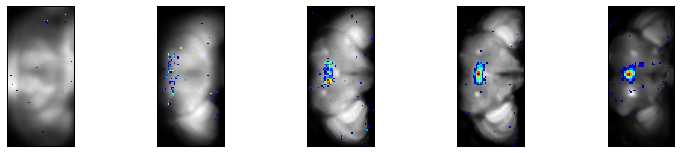

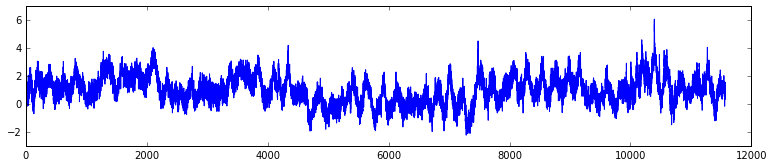


1


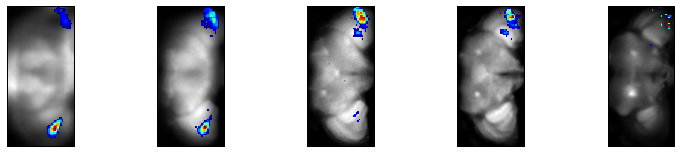

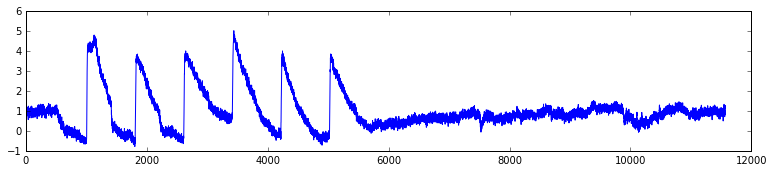


2


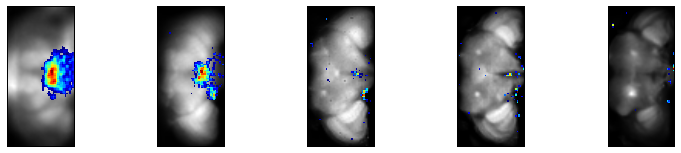

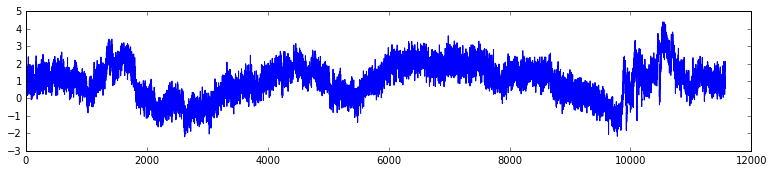


3


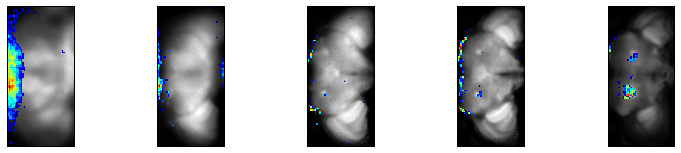

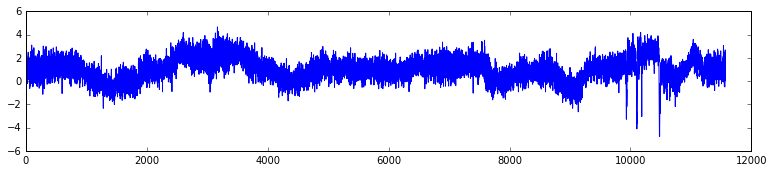


4


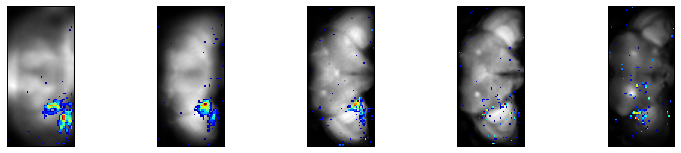

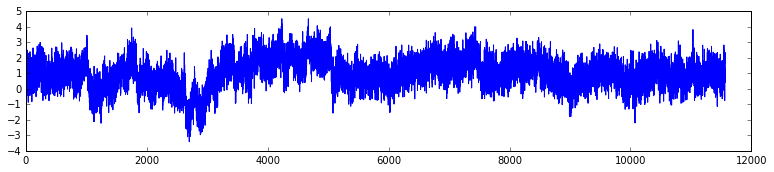


5


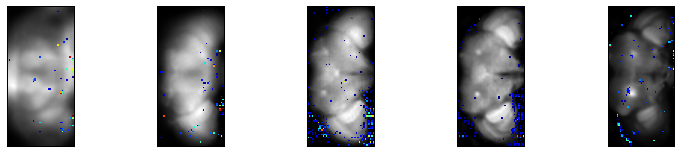

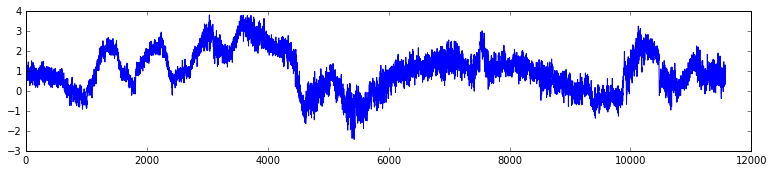


6


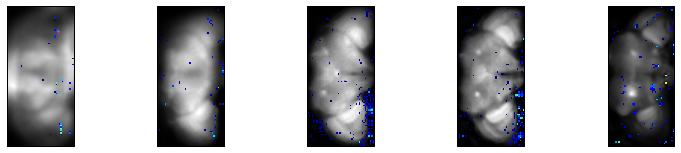

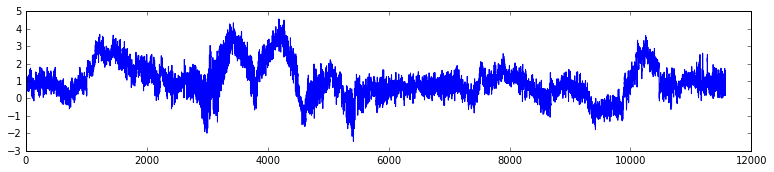


7


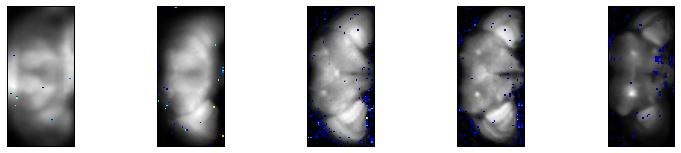

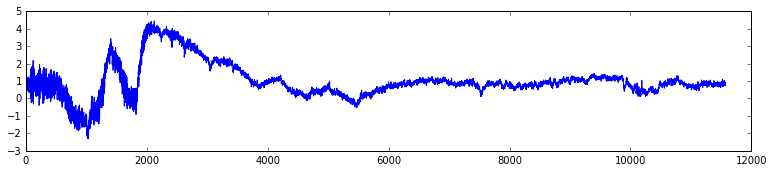


8


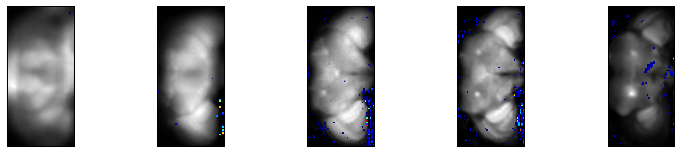

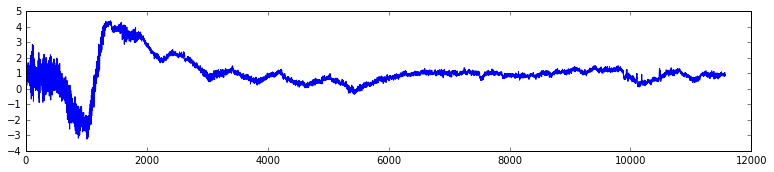


9


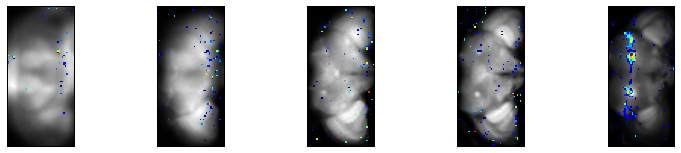

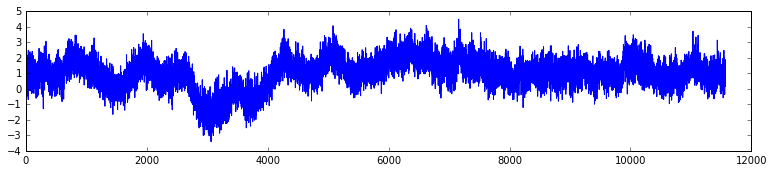


10


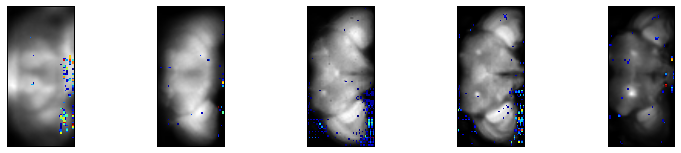

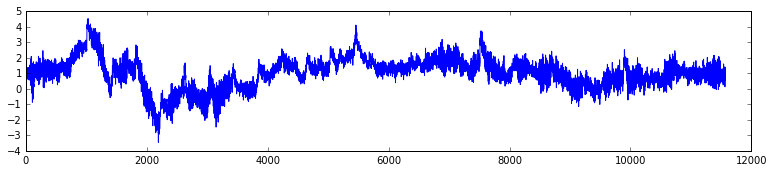


11


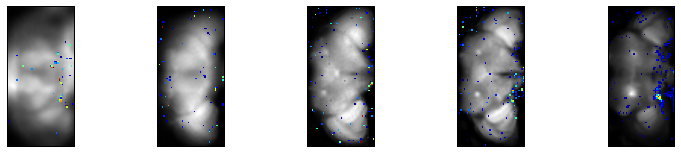

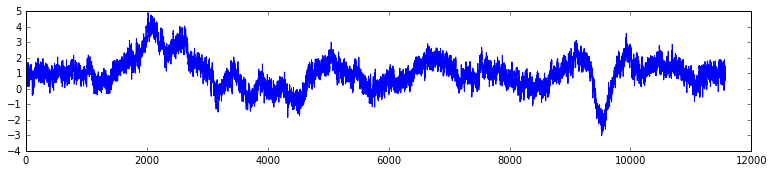


12


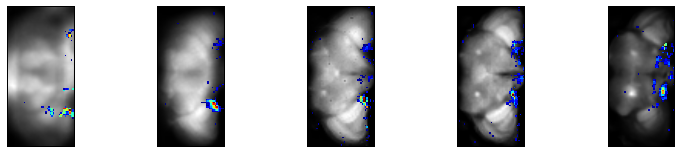

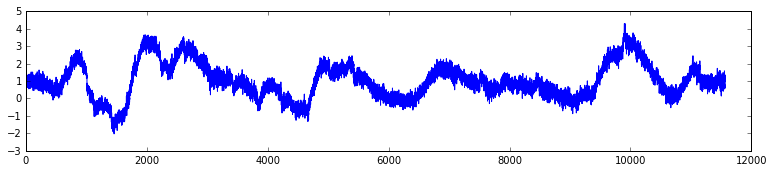


13


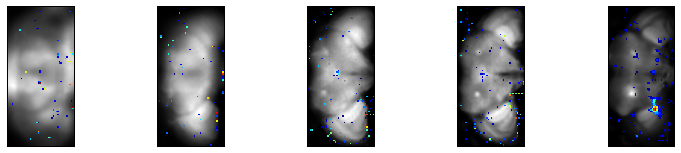

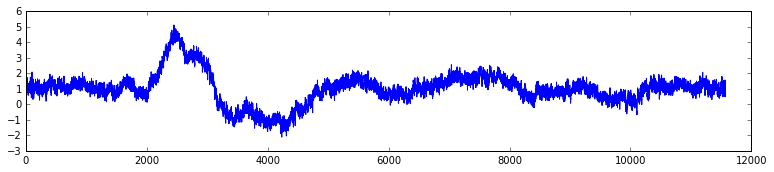


14


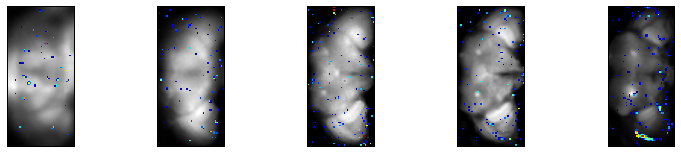

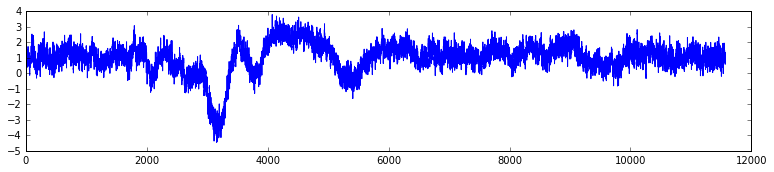


15


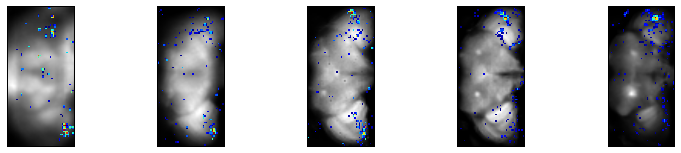

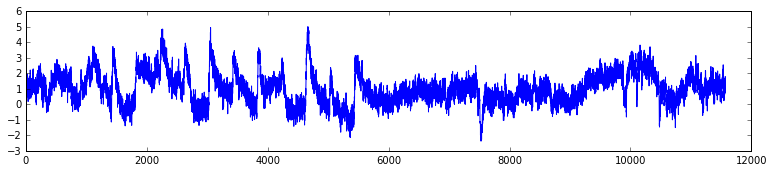


16


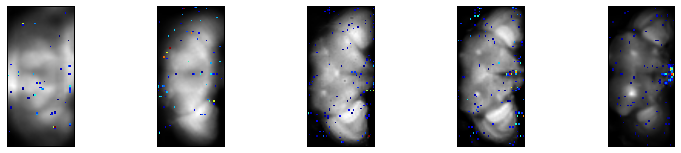

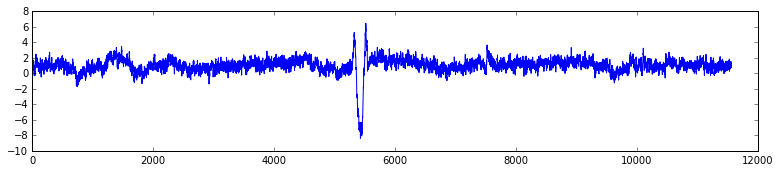


17


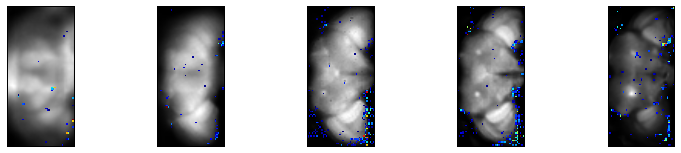

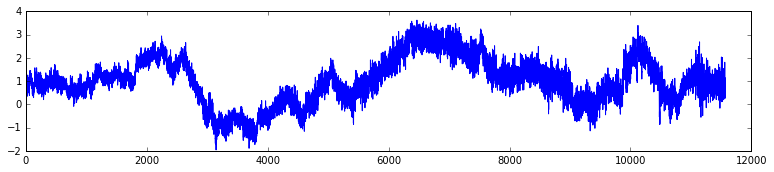


18


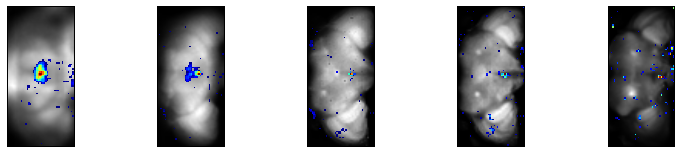

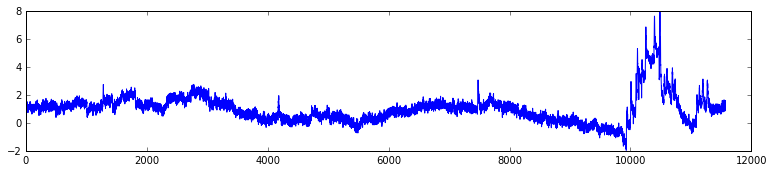


19


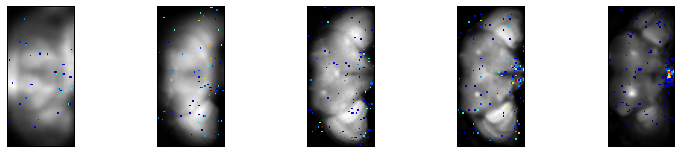

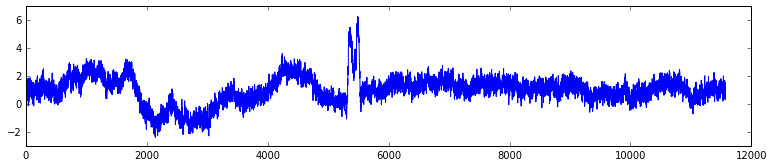


20


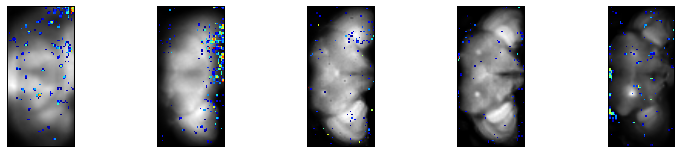

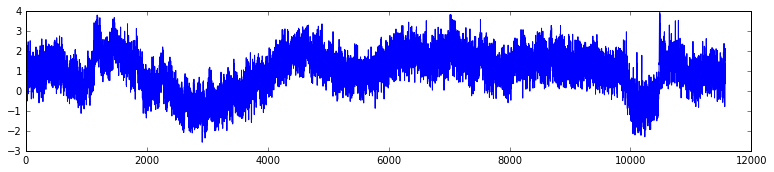


21


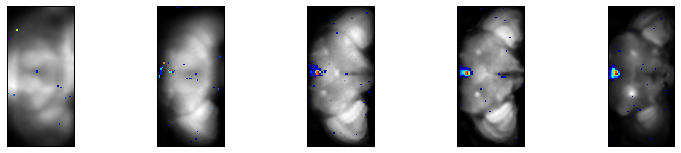

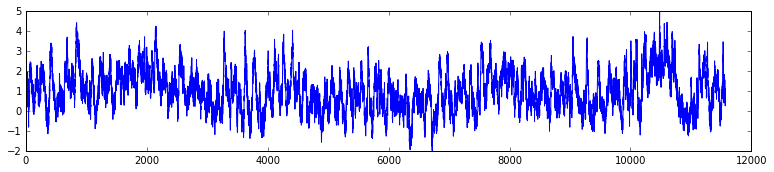


22


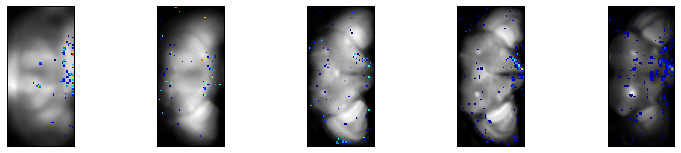

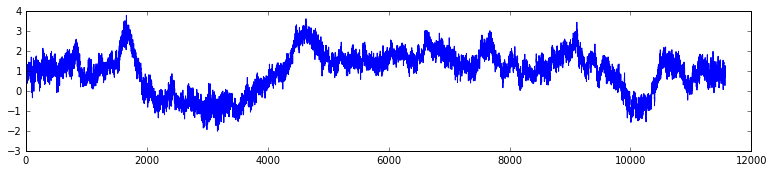


23


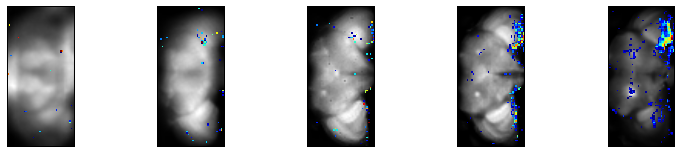

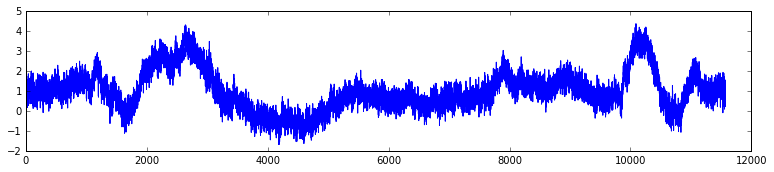


24


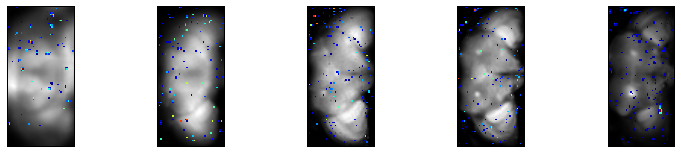

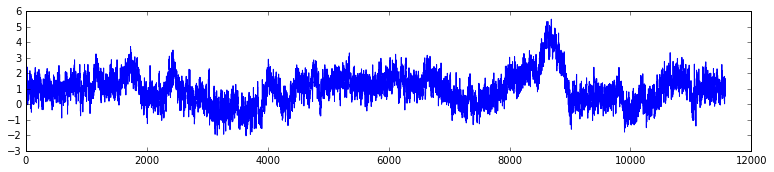


25


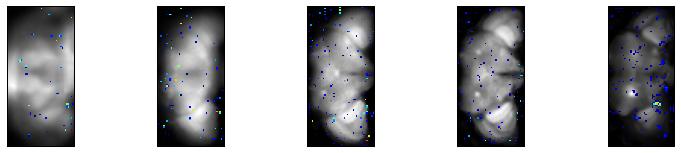

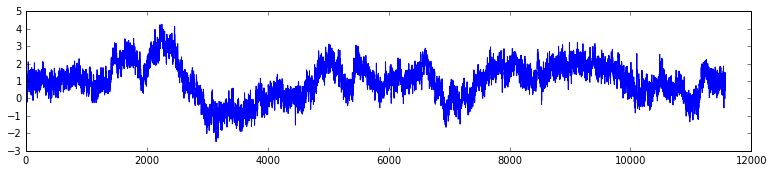


26


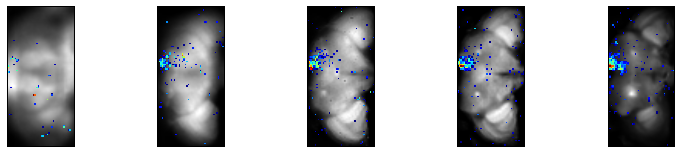

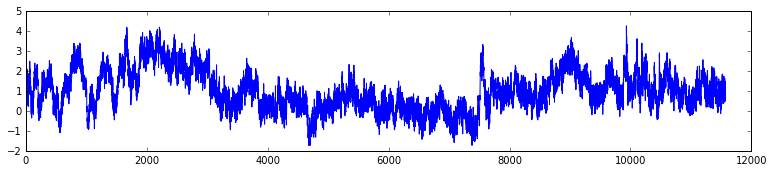


27


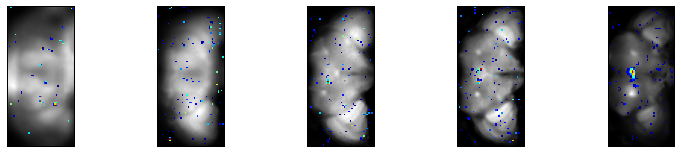

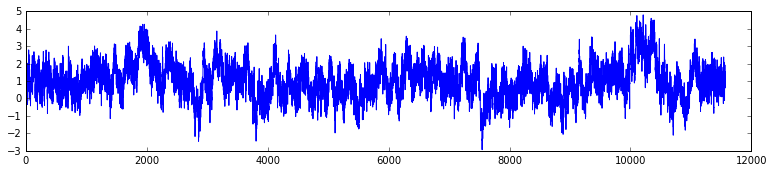


28


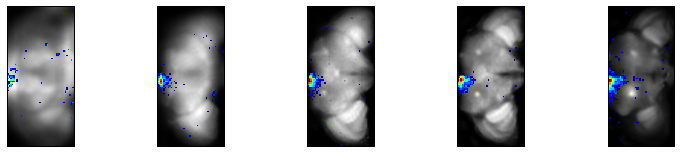

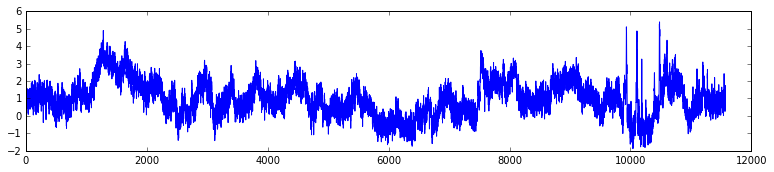


29


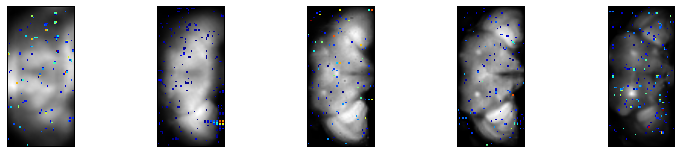

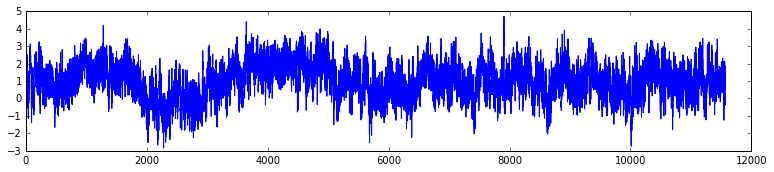


30


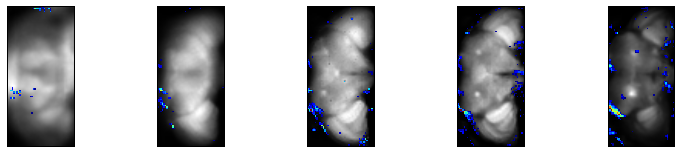

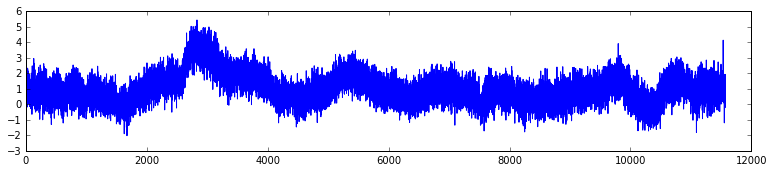


31


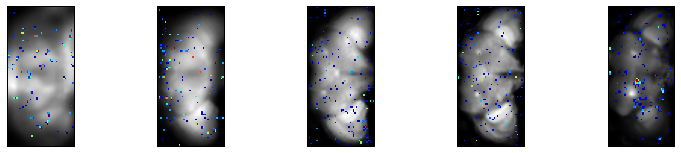

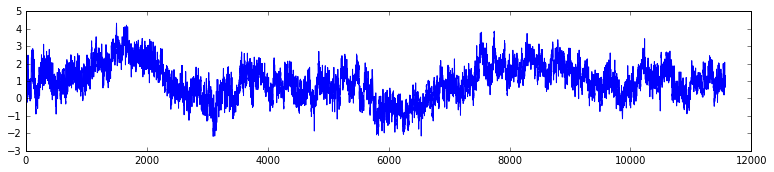


32


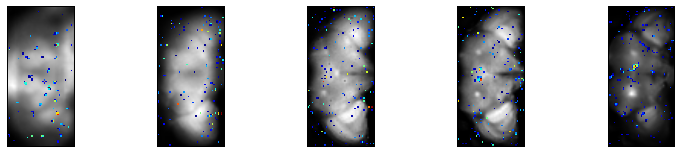

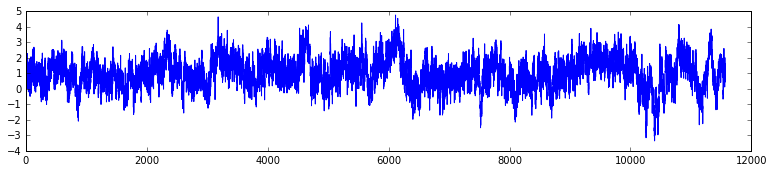


33


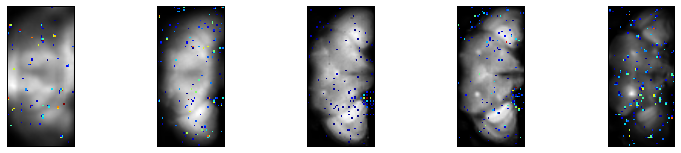

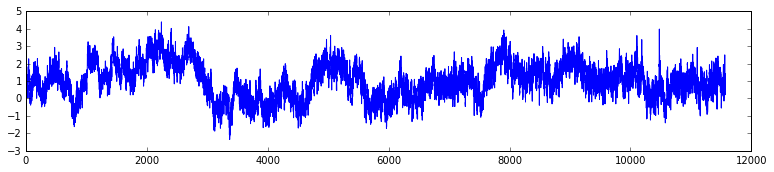


34


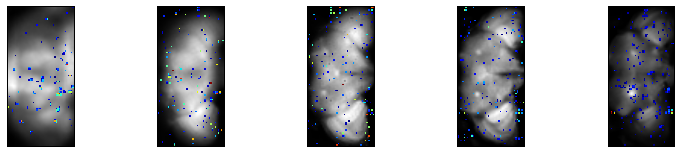

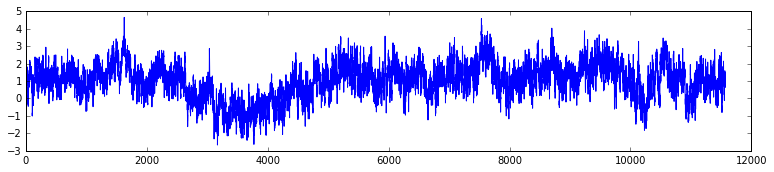


35


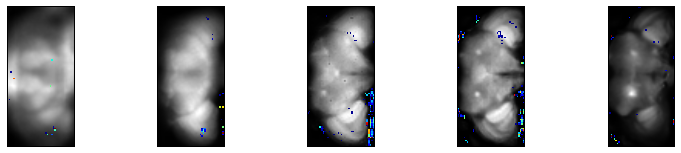

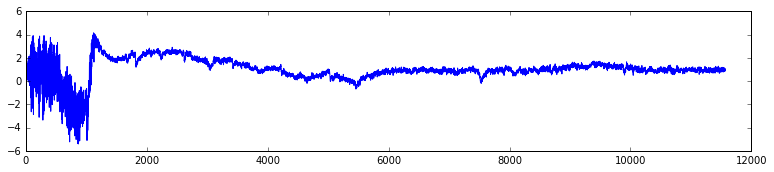


36


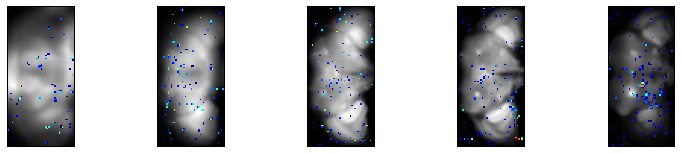

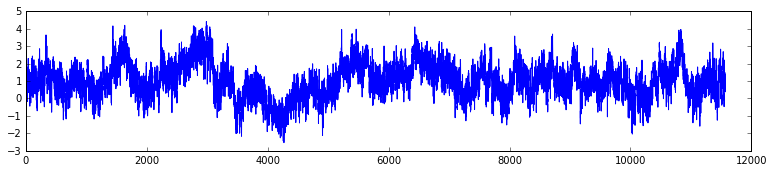


37


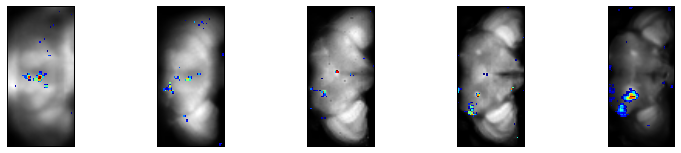

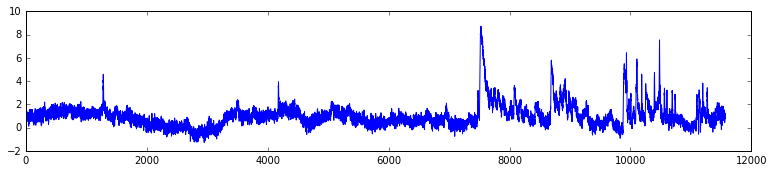


38


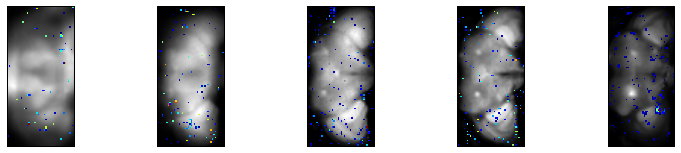

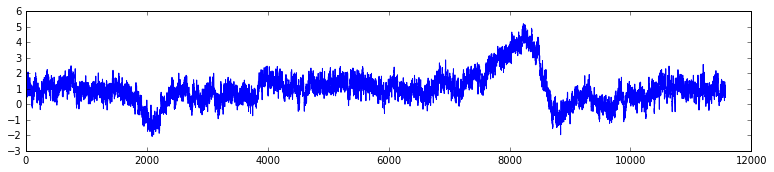


39


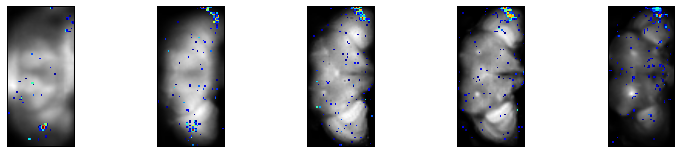

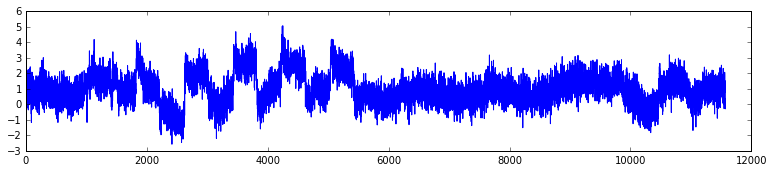


40


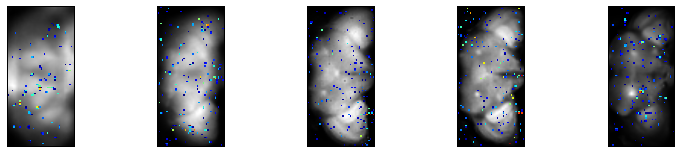

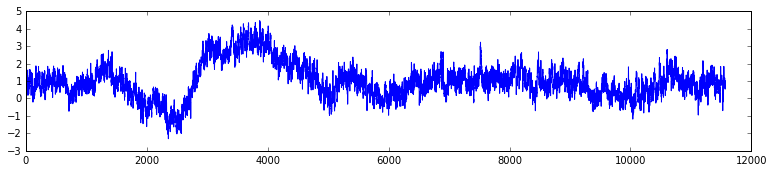


41


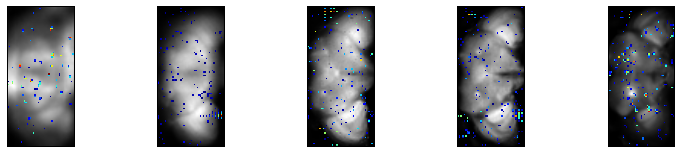

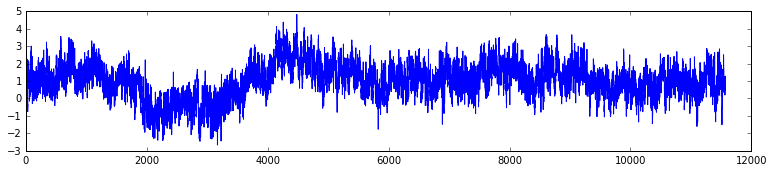


42


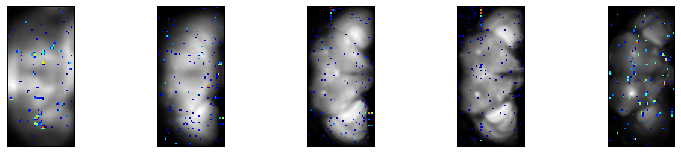

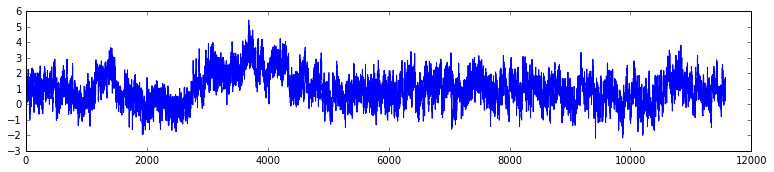


43


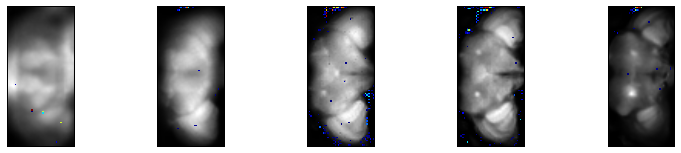

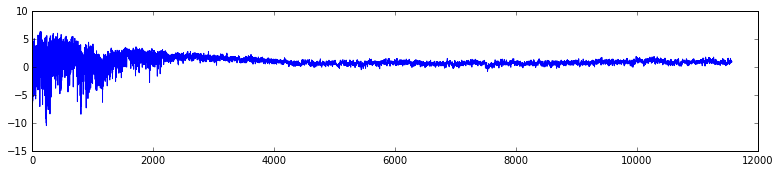


44


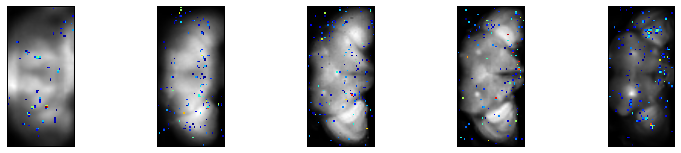

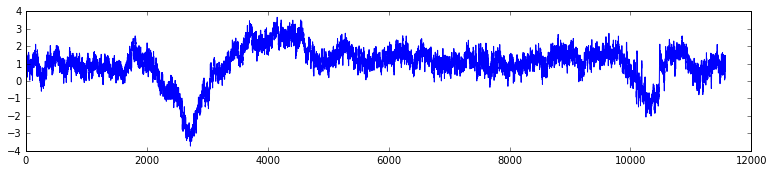


45


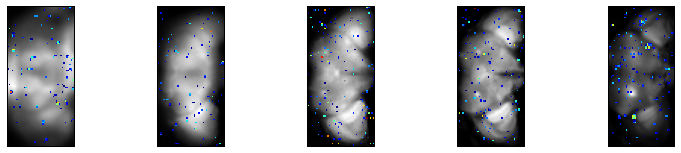

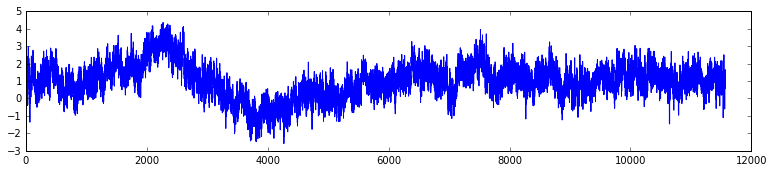


46


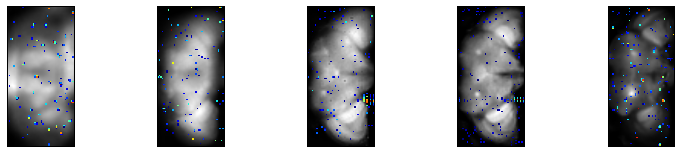

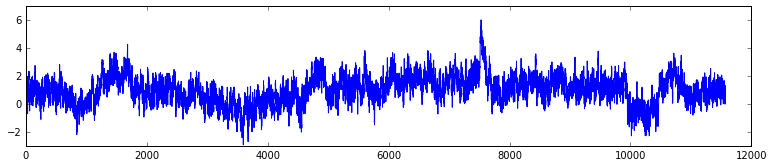


47


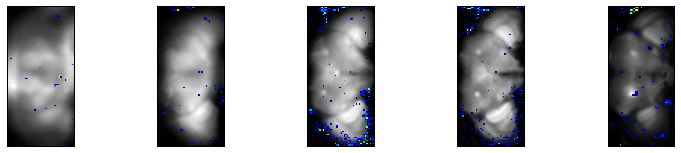

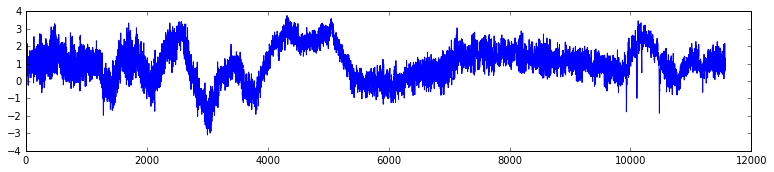


48


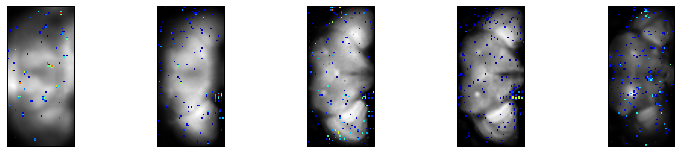

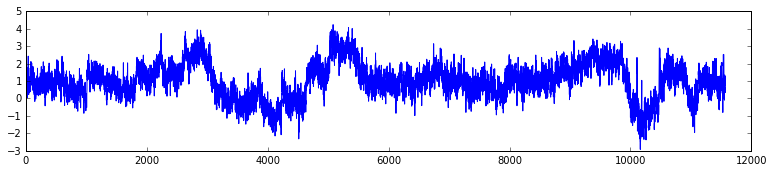


49


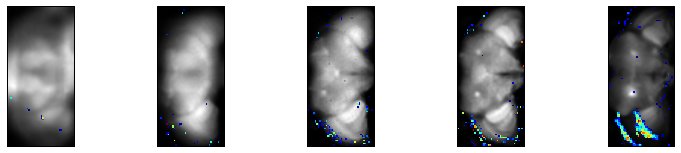

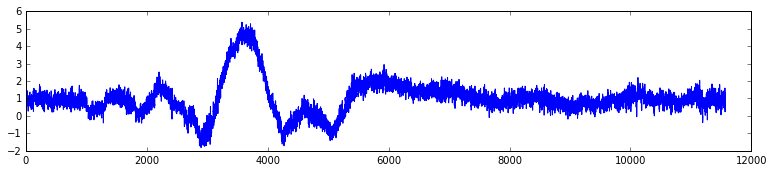


50


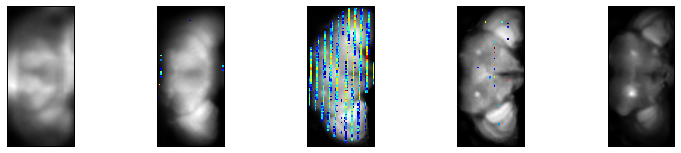

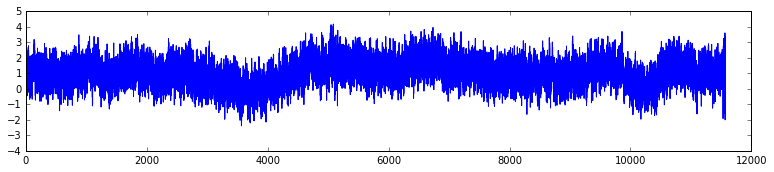


51


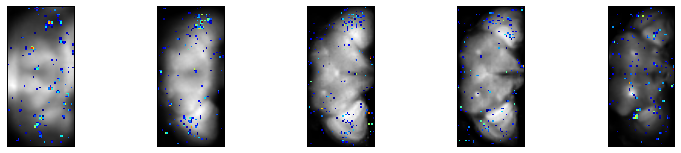

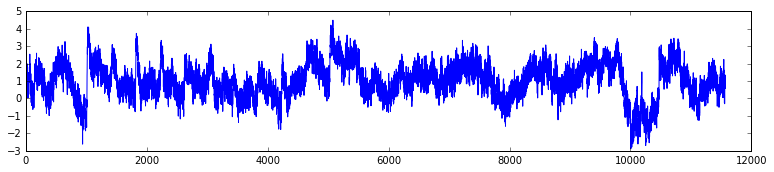


52


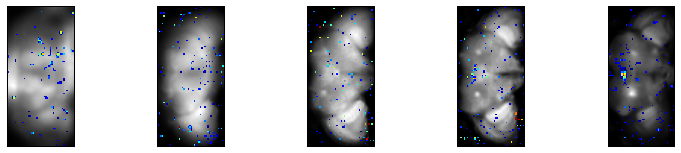

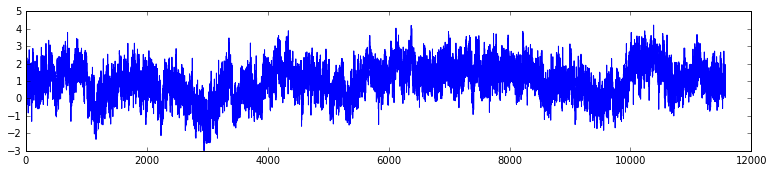


53


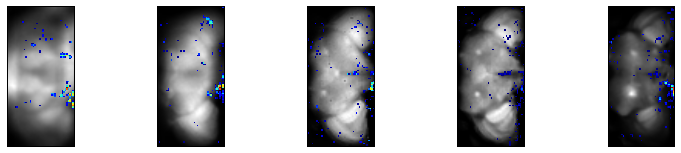

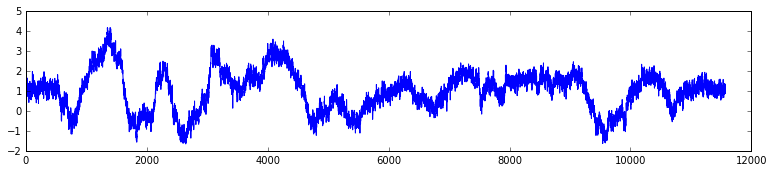


54


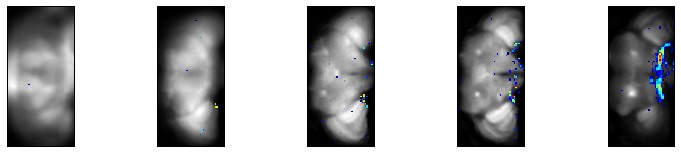

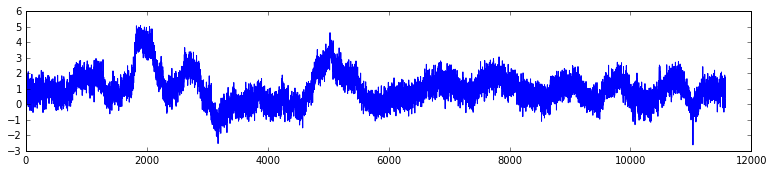


55


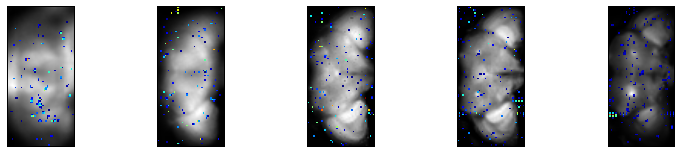

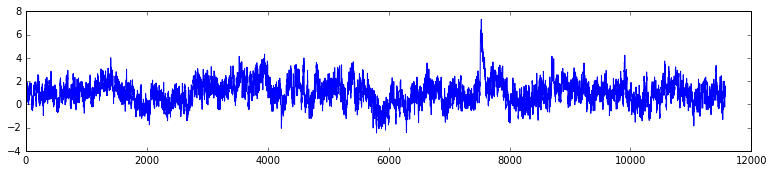


56


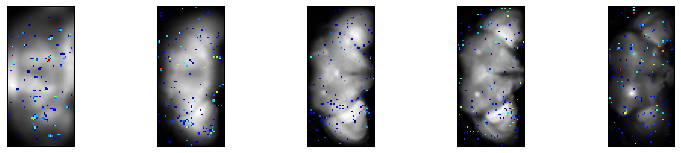

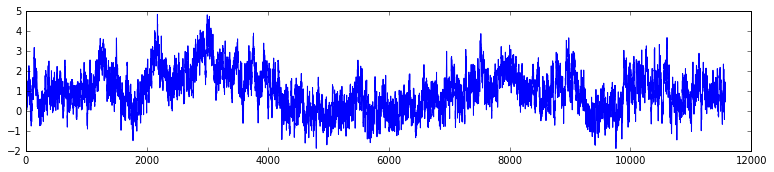


57


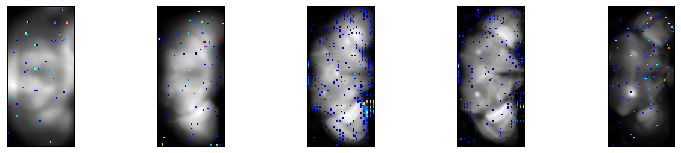

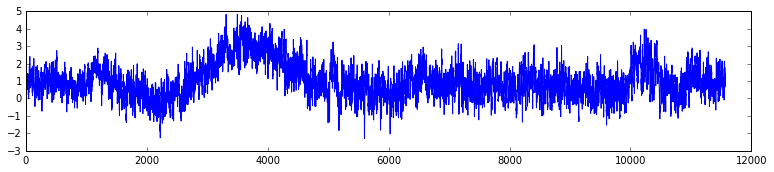


58


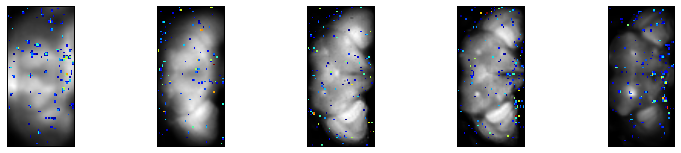

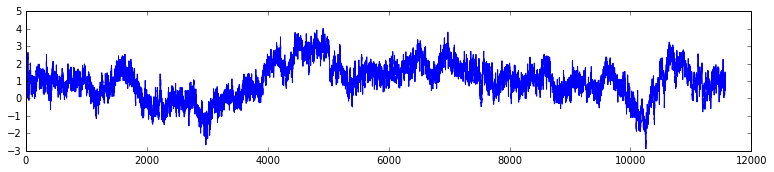


59


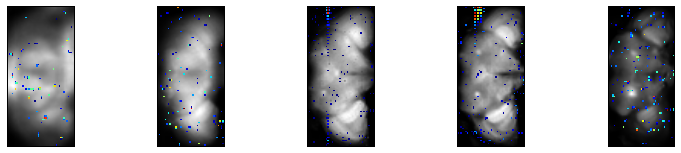

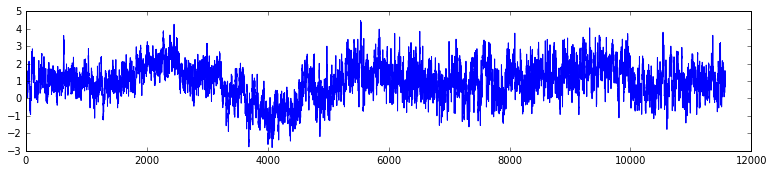


60


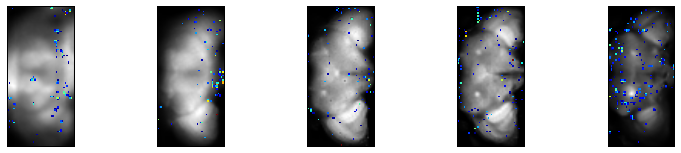

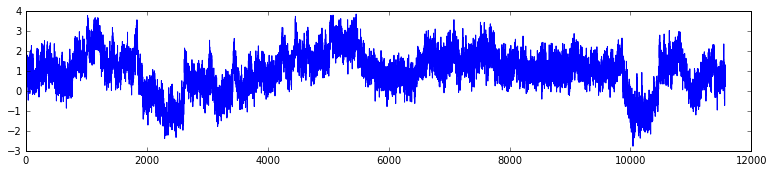


61


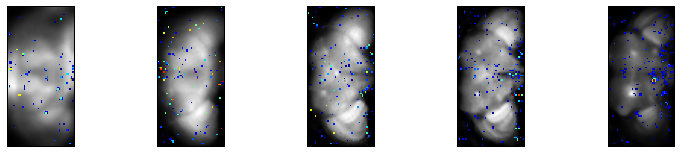

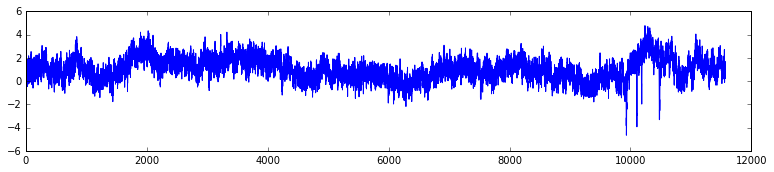


62


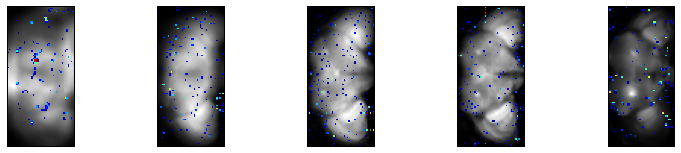

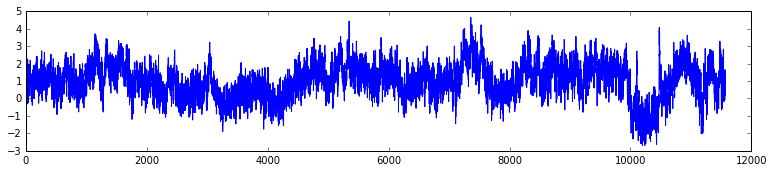


63


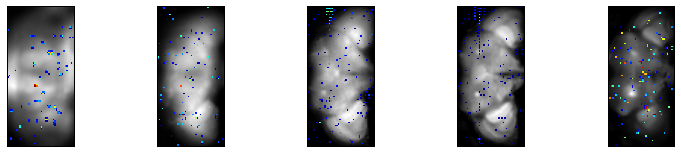

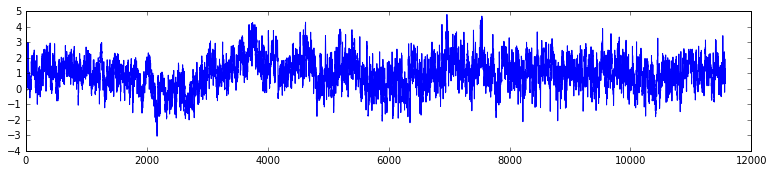


64


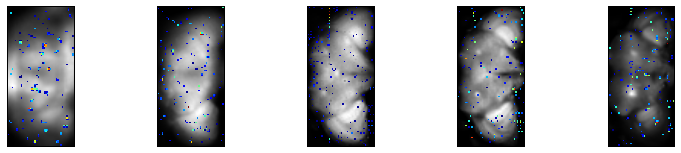

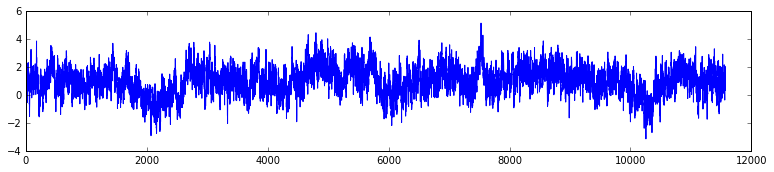


65


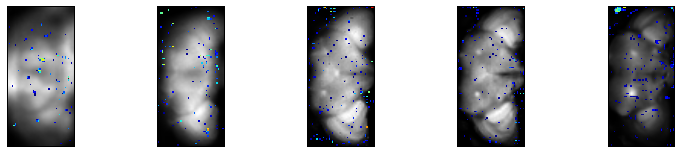

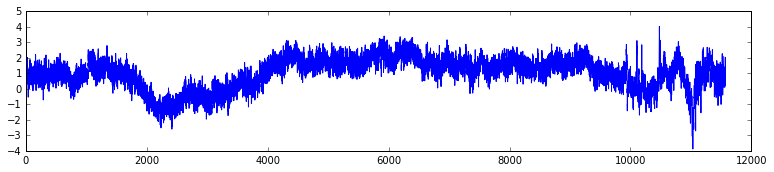


66


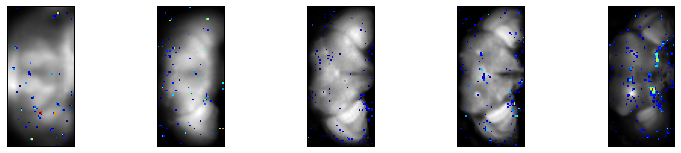

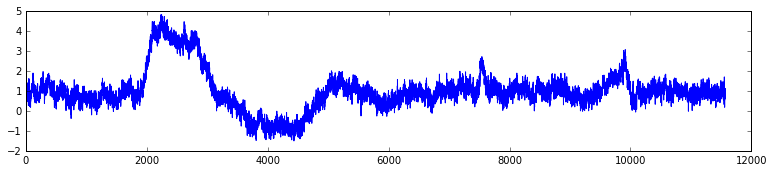


67


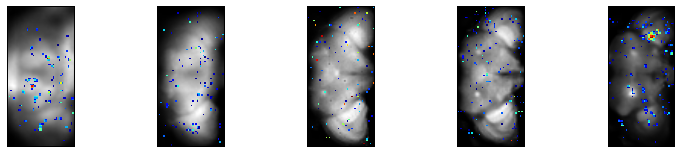

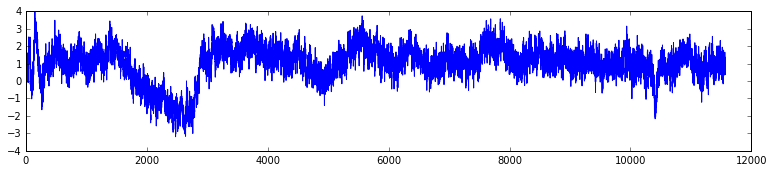


68


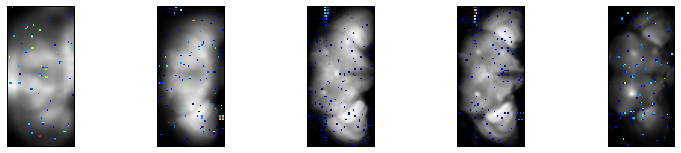

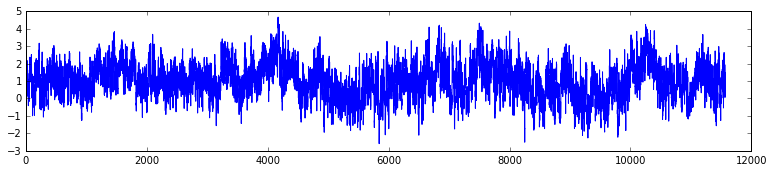


69


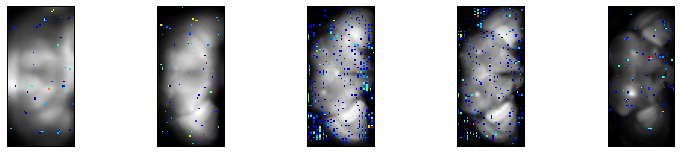

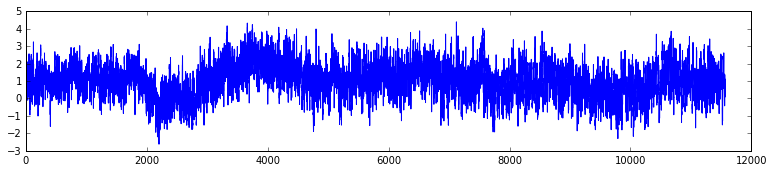


70


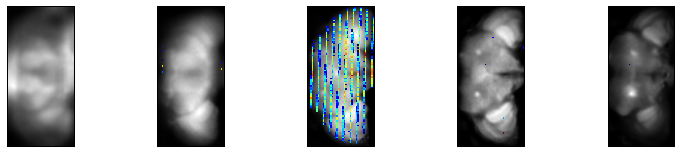

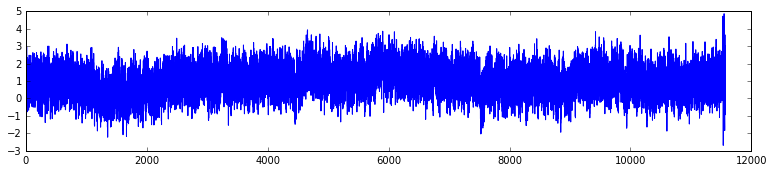


71


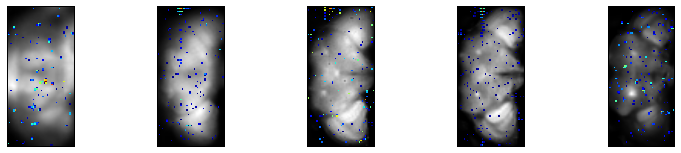

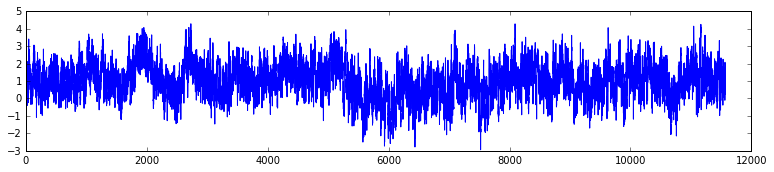


72


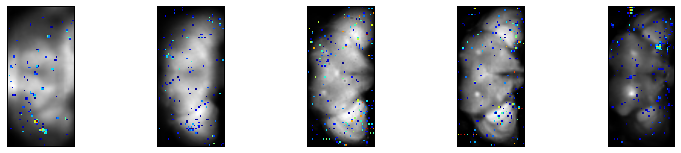

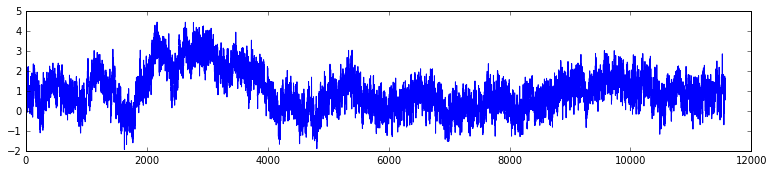


73


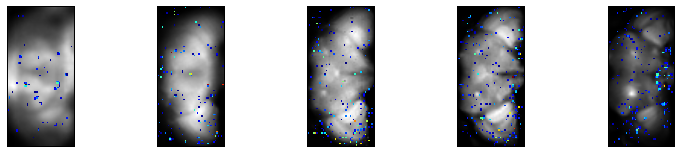

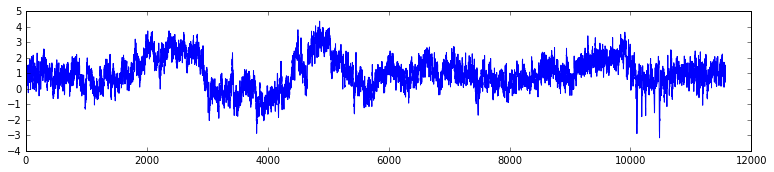


74


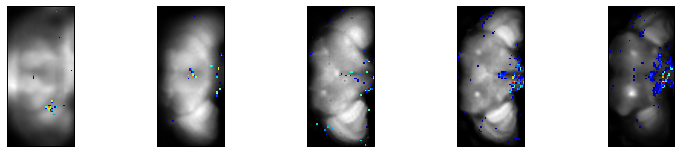

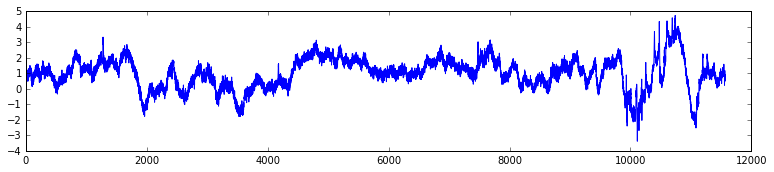


75


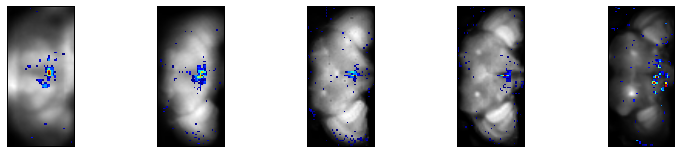

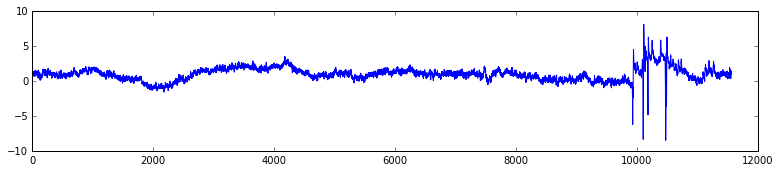


76


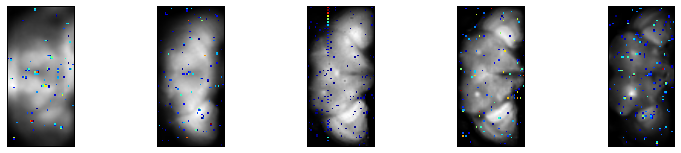

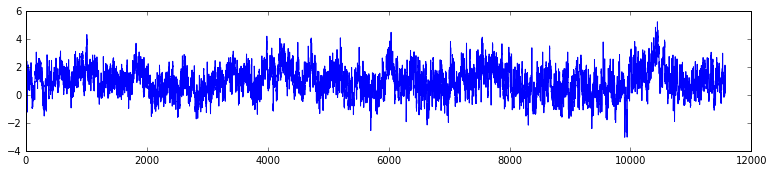


77


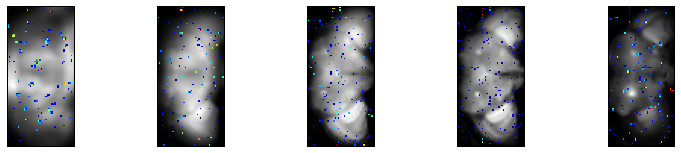

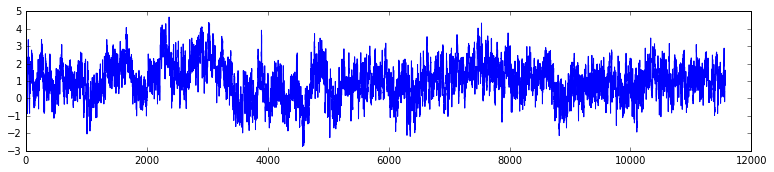


78


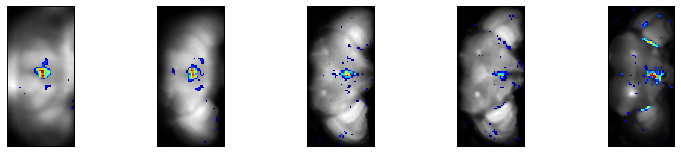

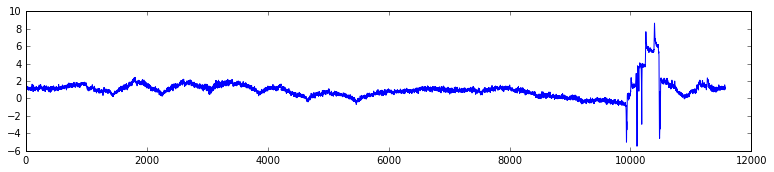


79


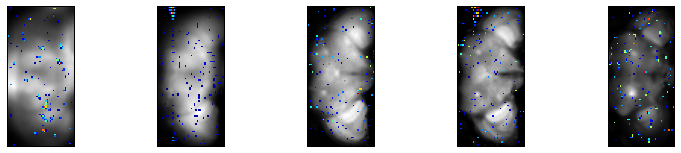

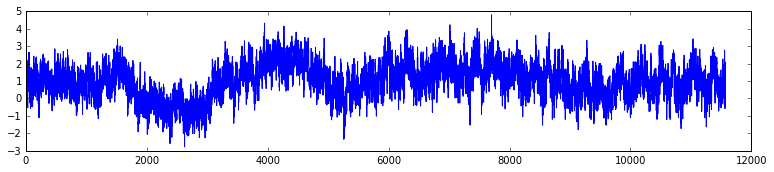


80


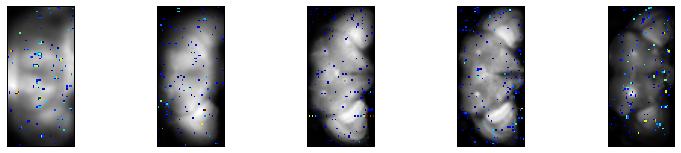

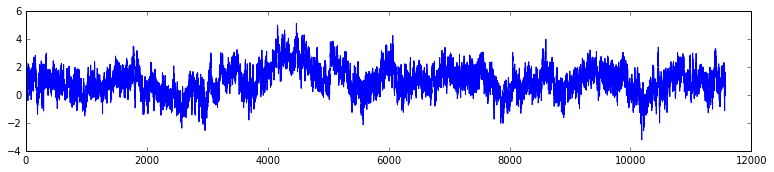


81


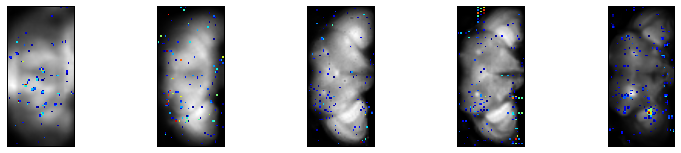

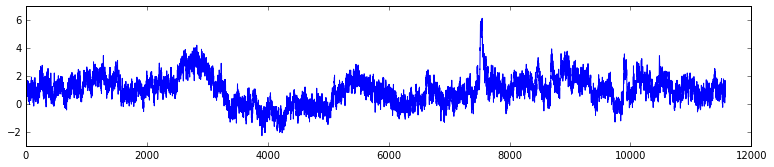


82


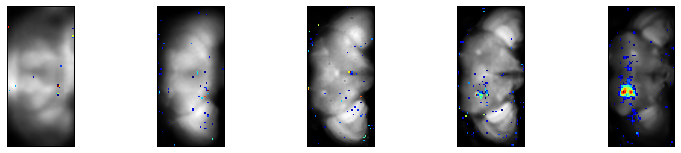

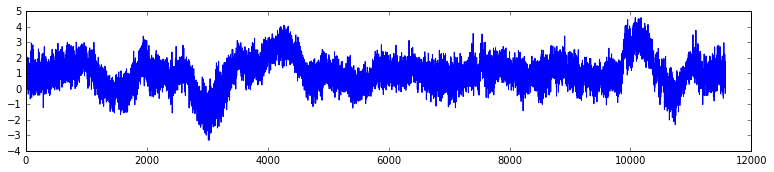


83


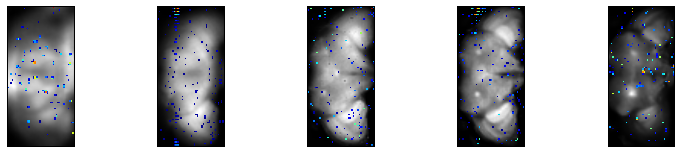

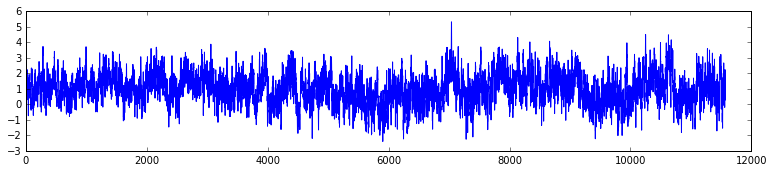


84


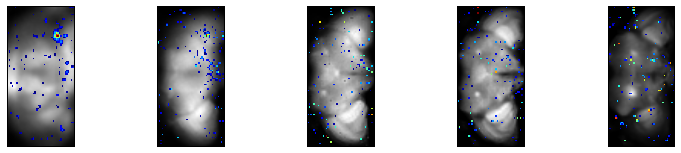

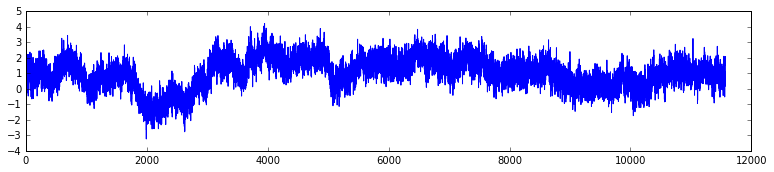


85


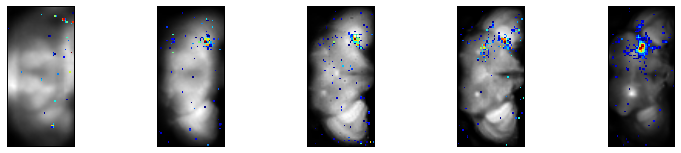

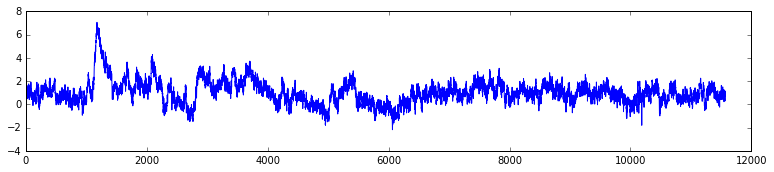


86


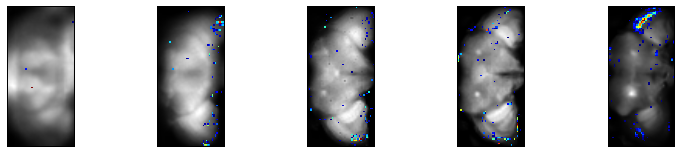

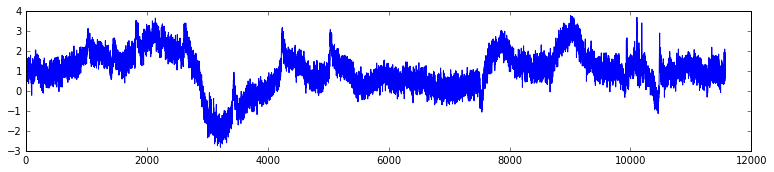


87


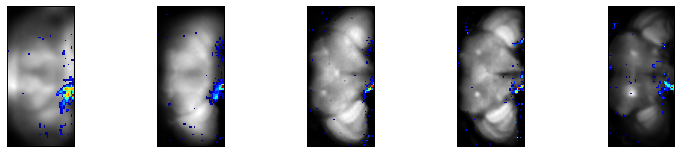

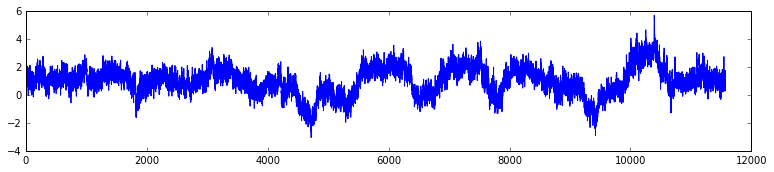


88


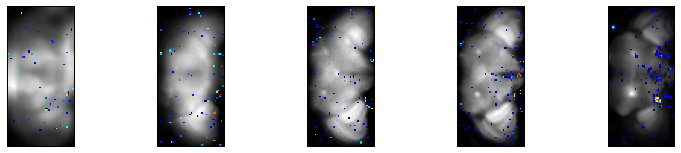

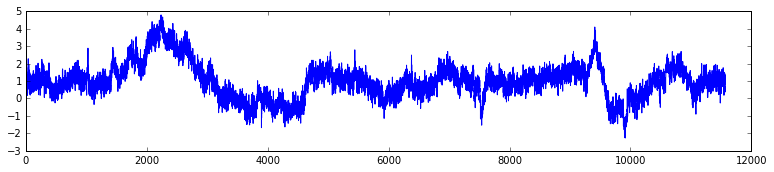


89


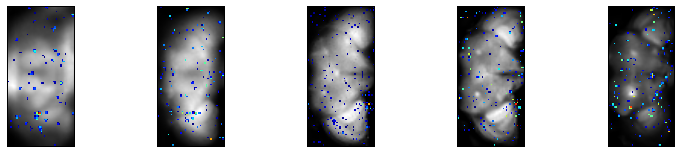

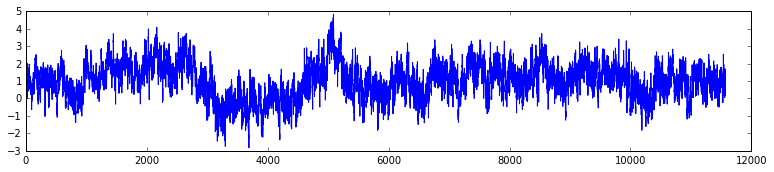


90


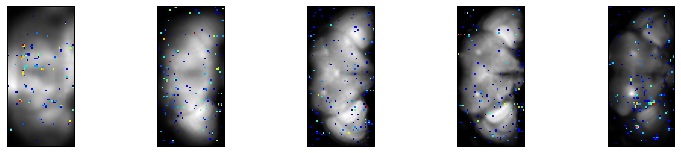

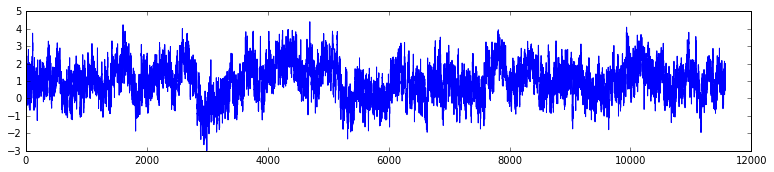


91


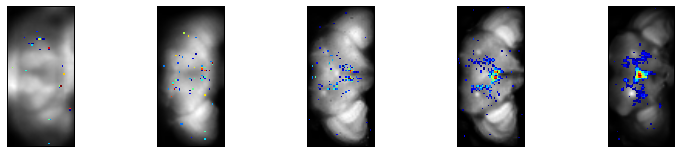

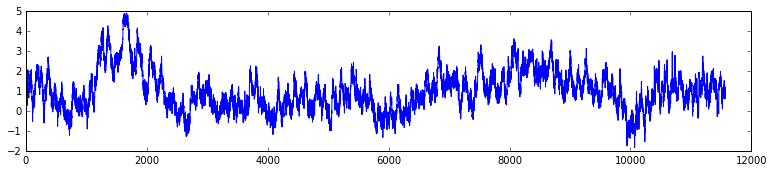


92


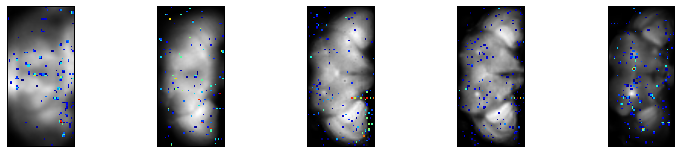

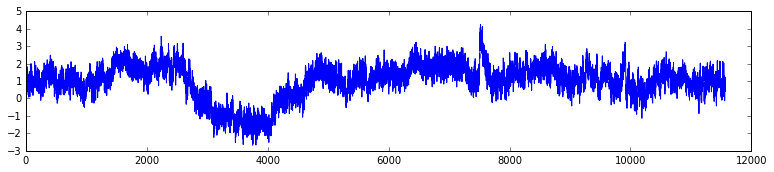


93


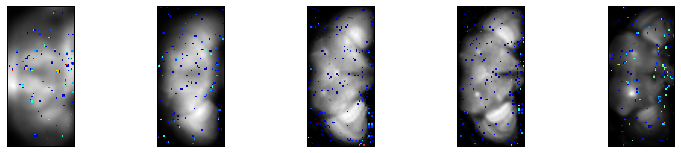

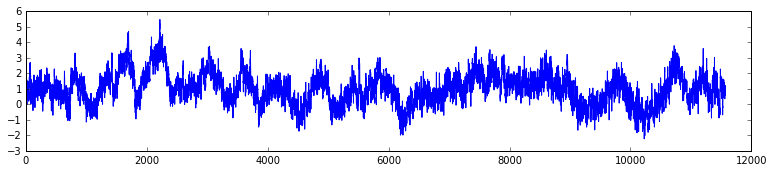


94


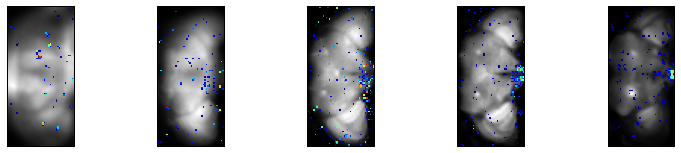

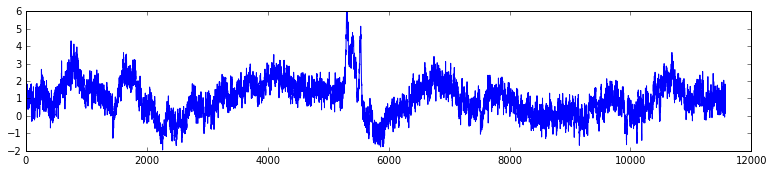


95


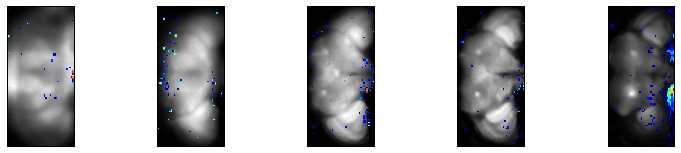

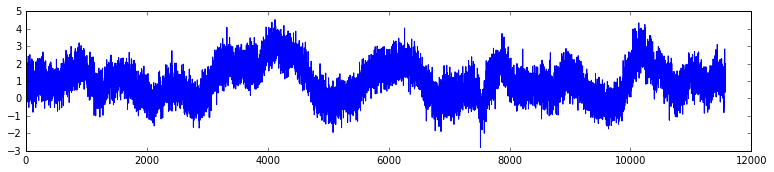


96


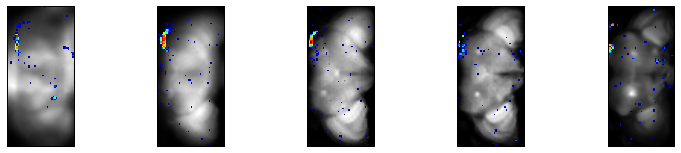

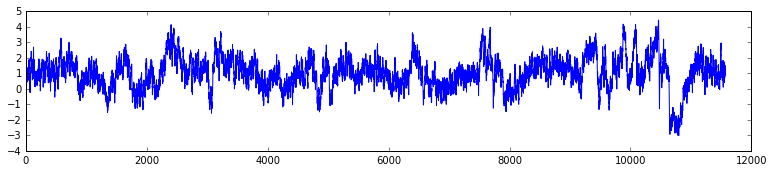


97


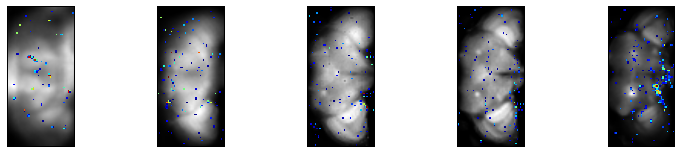

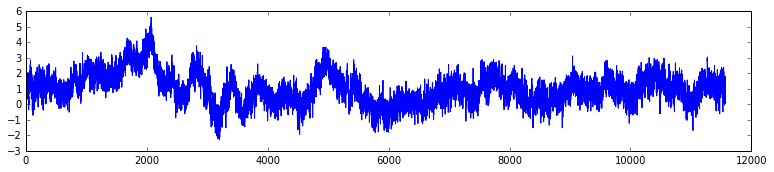


98


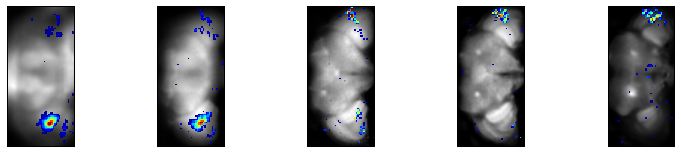

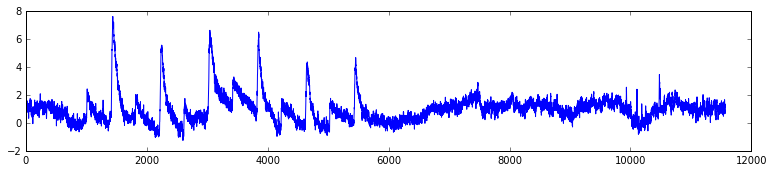


99


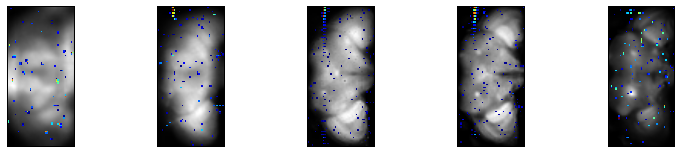

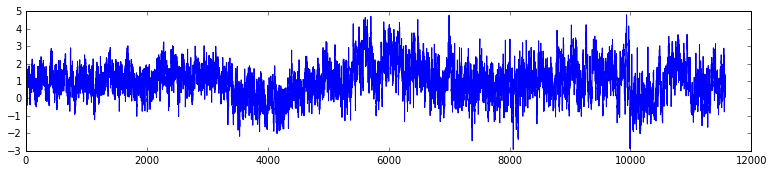


100


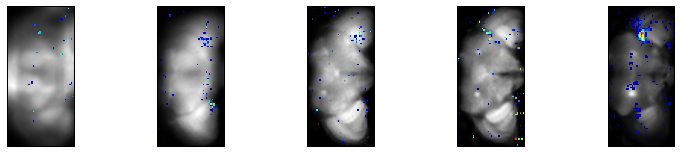

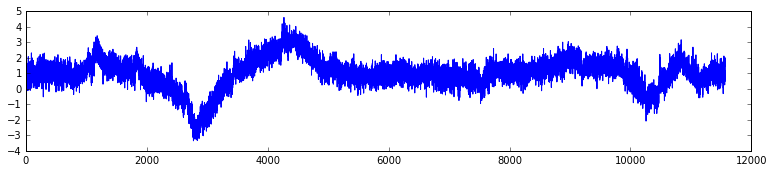


101


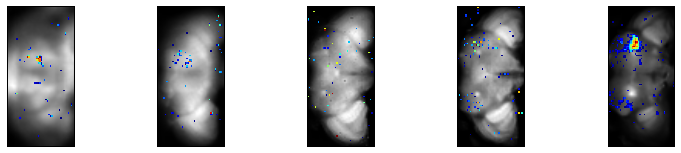

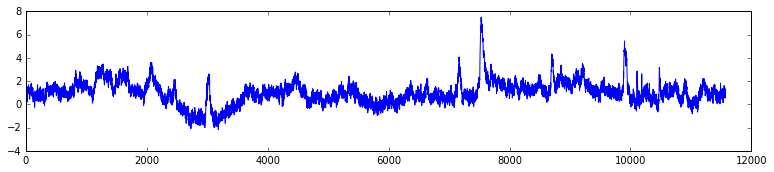


102


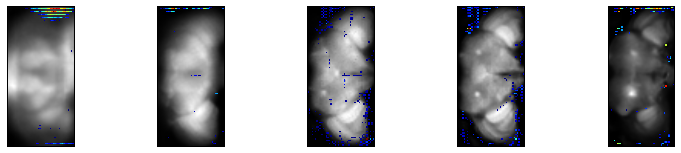

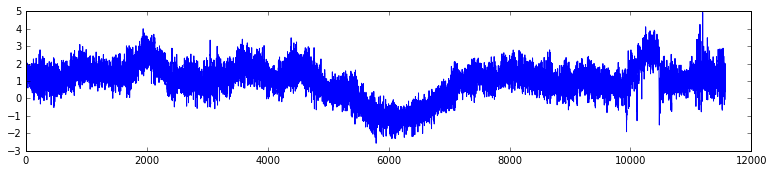


103


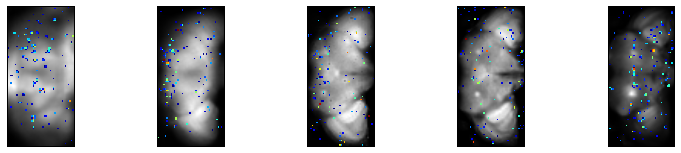

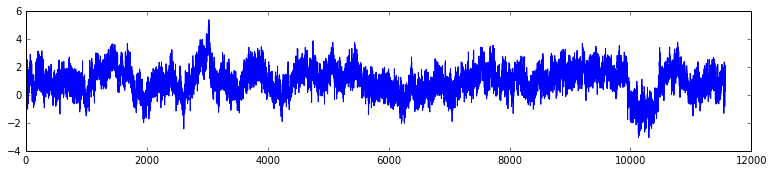


104


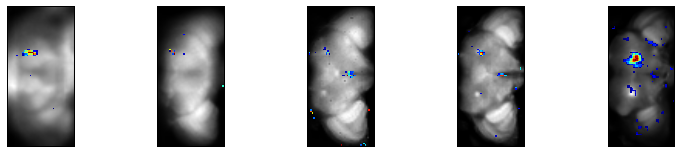

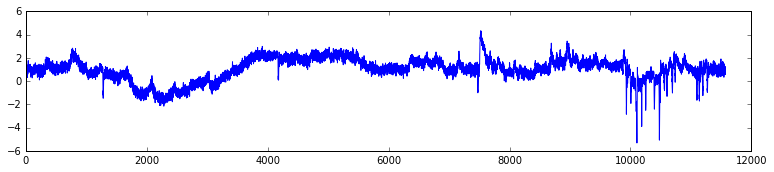


105


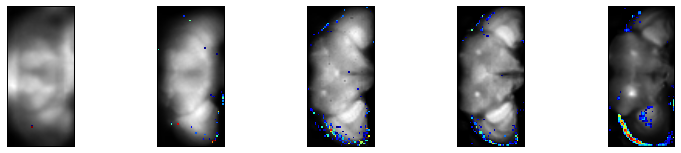

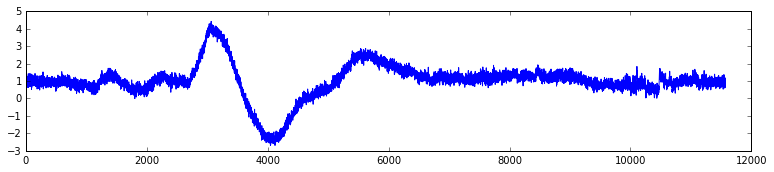


106


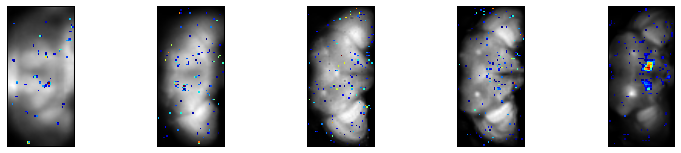

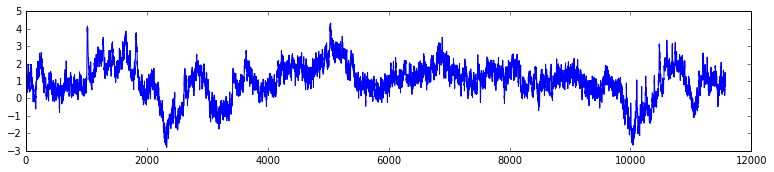


107


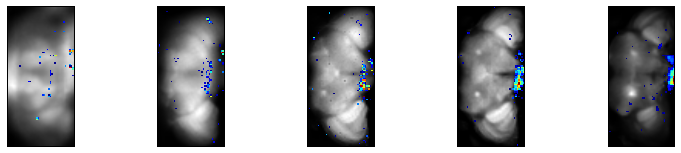

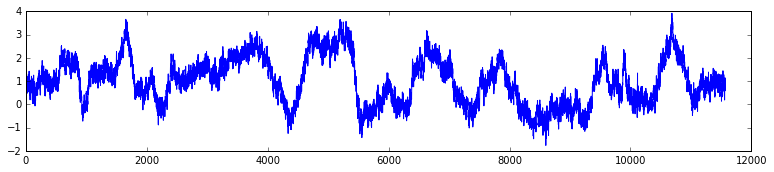


108


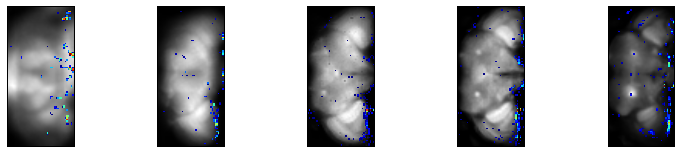

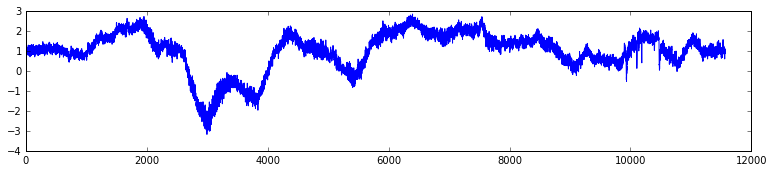


109


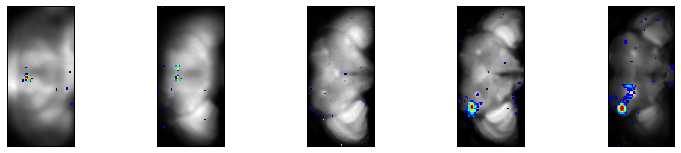

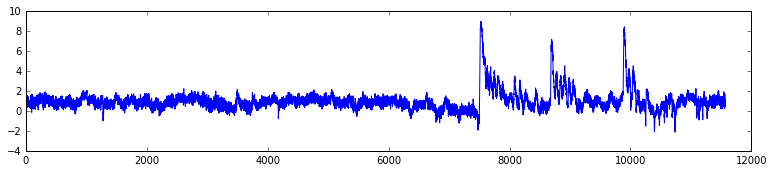


110


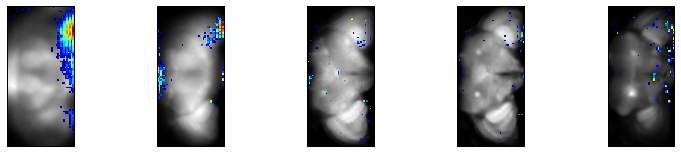

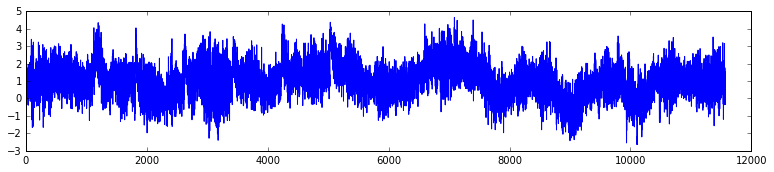


111


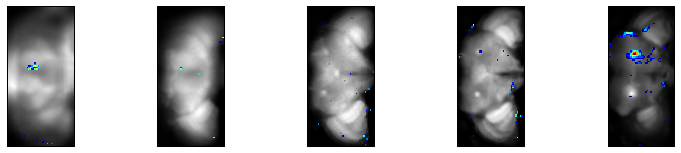

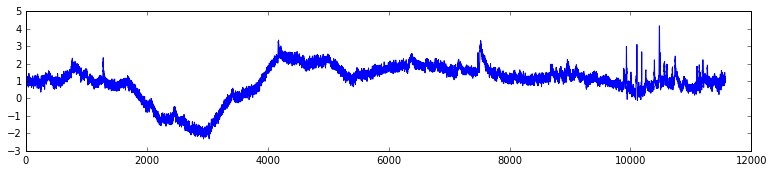


112


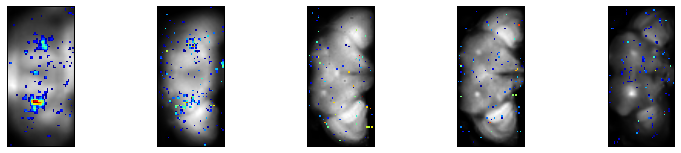

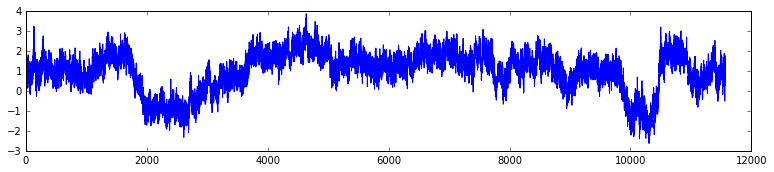


113


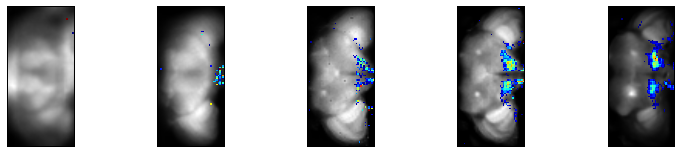

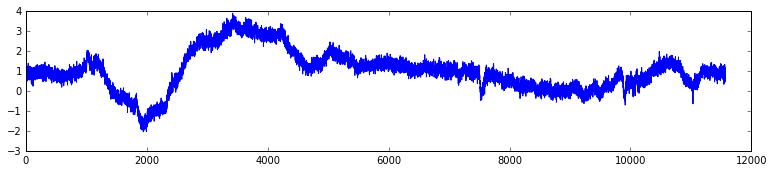


114


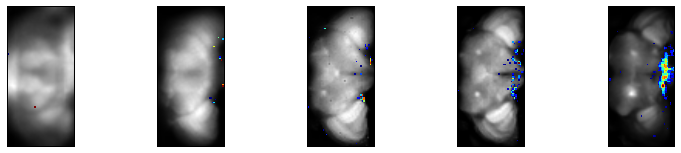

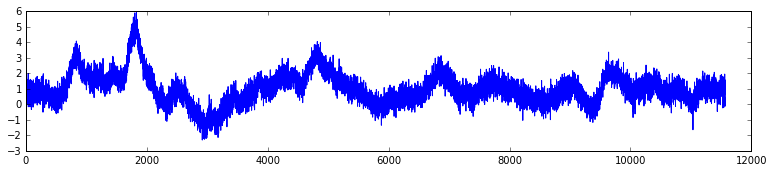


115


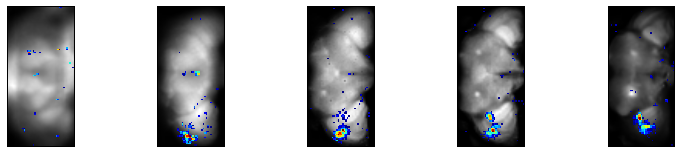

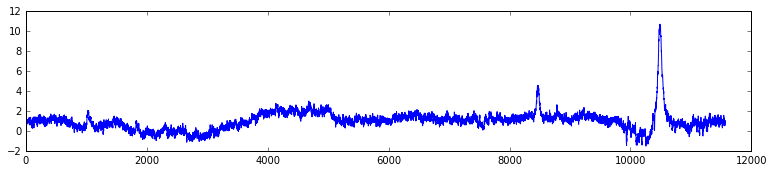


116


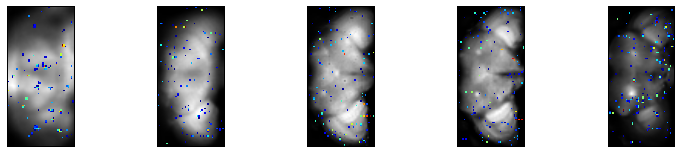

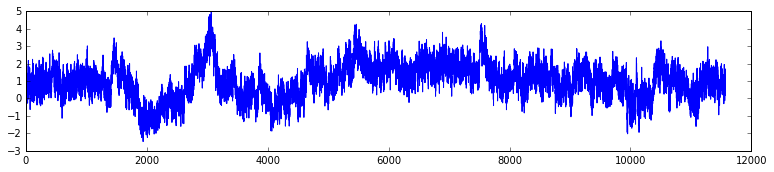


117


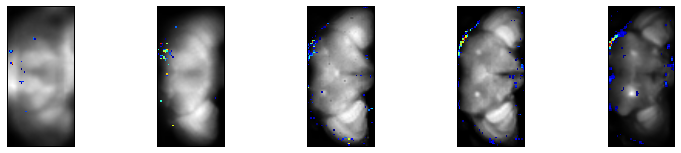

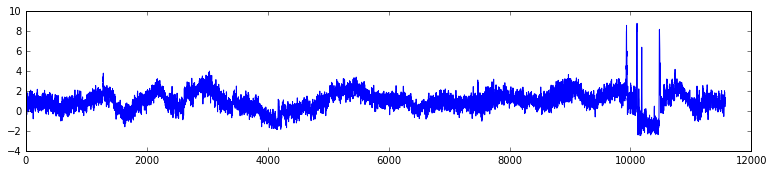


118


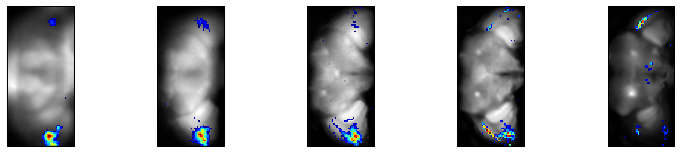

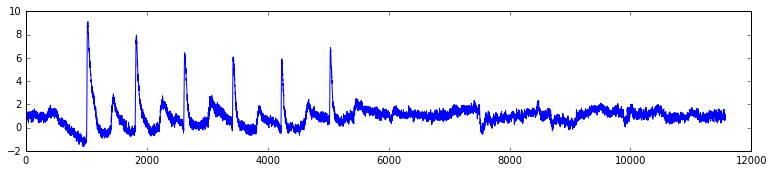


119


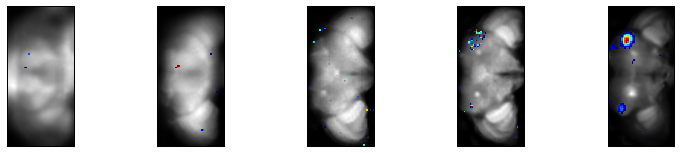

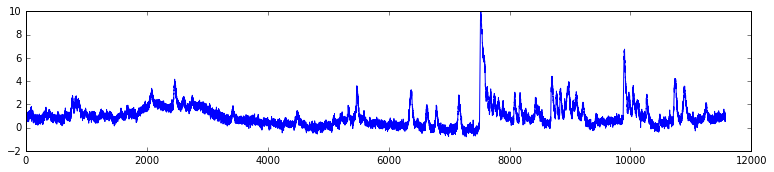


120


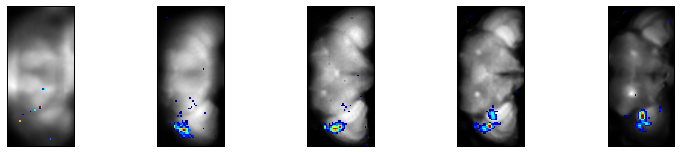

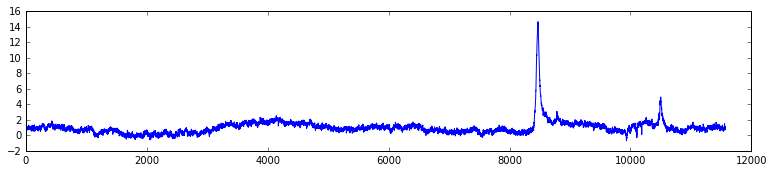


121


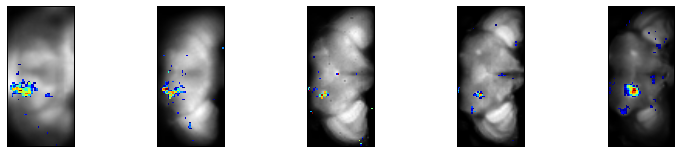

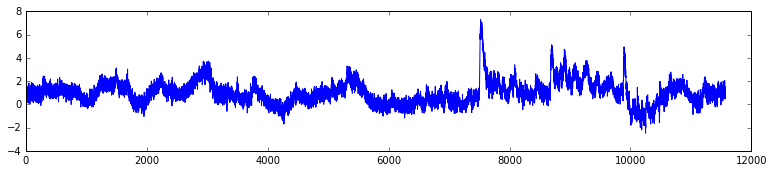


122


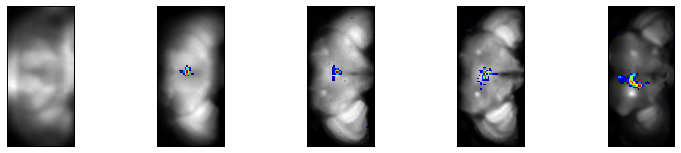

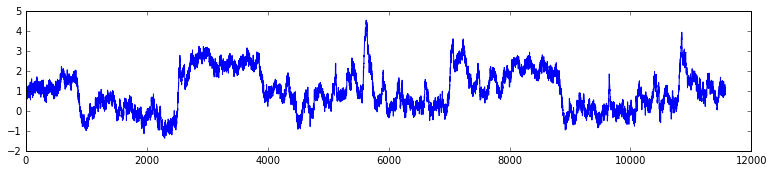

a
123


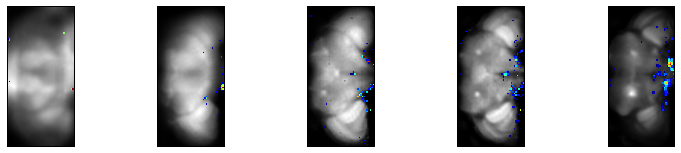

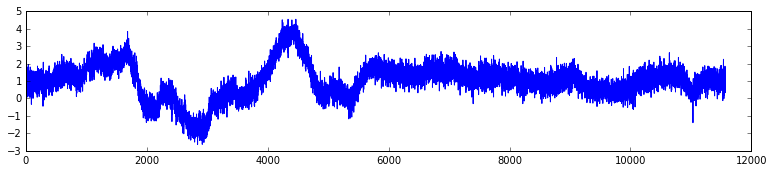


124


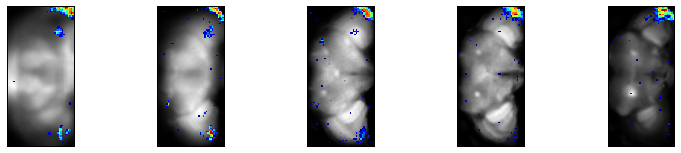

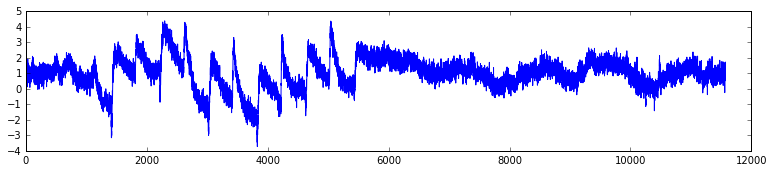


125


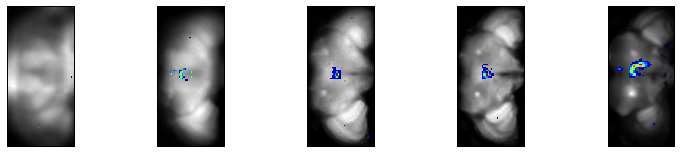

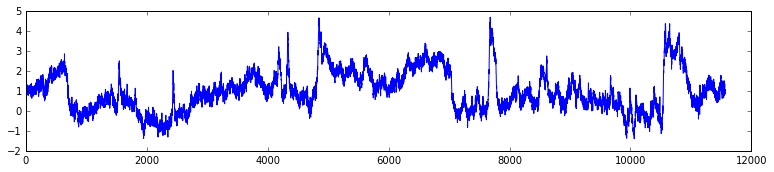

a
126


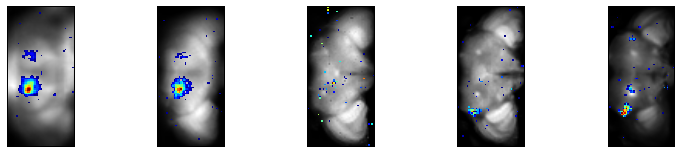

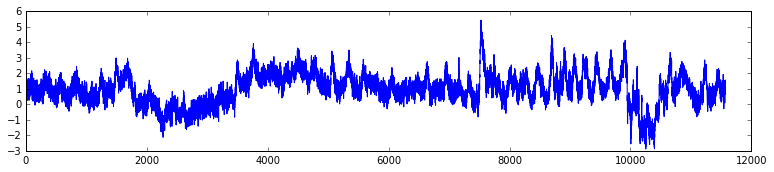


127


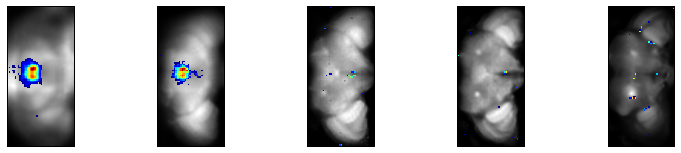

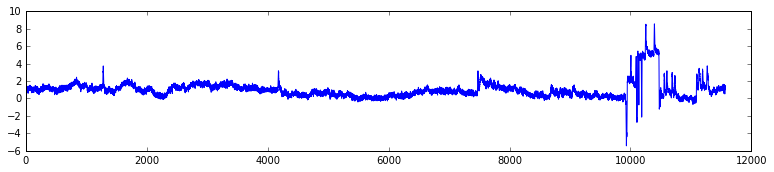


128


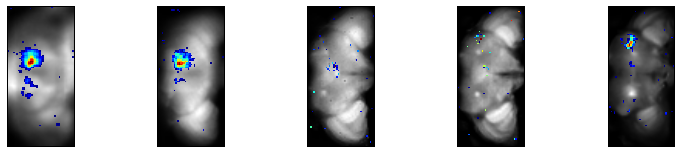

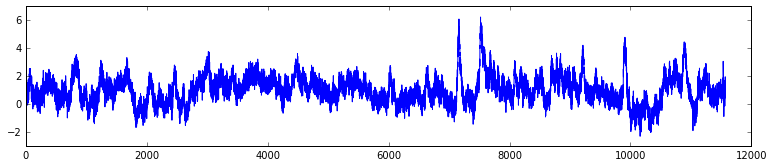

In [331]:
for j in range(S[3]):

    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],Order[j]]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,Order[j]]
            D1[:,:,i]=V 
            

    print(j)
    for i in range(Nstack):
        plt.subplot(1,5,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        
    plt.show()
    
    #plt.plot(TS_ROI[:,Order[j]]/np.sqrt(np.var(TS_ROI[:,Order[j]])))
    plt.plot(DT[:,Order[j]]/np.sqrt(np.var(DT[:,Order[j]]))+1)

    #plt.plot(Tb,Rightb+0.5, marker='o')
    #plt.plot(Tb,Leftb)
    #plt.plot(Tstim,UV+0.3, marker='o')
    #plt.plot(Tstim,Odor+0.3,marker='o')
    plt.show()
    
    Label_ICs.append(raw_input())
    if Label_ICs[j]=='':
        Good_ICs[j]=0
    else:
        Good_ICs[j]=1
        
        

In [332]:
Dmaps.shape

(92, 44, 10, 129)

In [333]:
set(Label_ICs)

{'', 'a'}

In [334]:
Good_ICs[12]=0

In [335]:
Label_ICs[12]=''

In [336]:
if len(Label_ICs)<S[3]:
    for j in range(S[3]-len(Label_ICs)):
      Label_ICs.append('')  

In [337]:
Dict={'a':0,'AL':0,'Co':1,'CO':1,'O':2,'o':2,'OG':3,'AVLP':3,'A':0,'G':5,'PN':5,'CA':6,'Ca':6,'L':4,'LH':6,'l':6,'KC':7,'kc':7,'M':7,'MB':1,'mb':1,'FB':2,'EB':3,'eb':8,'C':4,'c':8,'PB':9,'pb':9,'AMMC':10,'ammc':10,'V':5,'PS':11,'S':11,'SOG':11,'s':11,'PI':12,'I':12,'i':12,'D':5,'':14,'0':14}

In [338]:
Translated=[Dict[X] for X in Label_ICs]

In [339]:
G=Good_ICs.tolist();

In [340]:
len(Good_ICs)

129

In [341]:
G.count(1)

2

In [342]:
where_are_NaNs = np.isnan(D2)

D2[where_are_NaNs] = 0

In [343]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3])
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [344]:
D2.shape

(92, 44, 5, 129)

In [345]:
S

(92, 44, 10, 129)

In [346]:
i=0
for j in range(S[3]):    
    if Good_ICs[j]:
        if i==0:
            C[j,:]=(1,0,1)
            i=i+1
        else:
            C[j,:]=(0,1,0)
        
        for k in range(3):
            M=np.max(np.squeeze(np.reshape(D2[:,:,:,j],S[0]*S[1]*5)))
            #M[M==0]=1
  #          Fmaps[:,:,:,k]=0.7*Dmaps[:,:,:,j]*C[j,k]/np.max(np.squeeze(np.reshape(Dmaps[:,:,:,j]*np.max(C[j,:],S[0]*S[1]*5))
            Fmaps[:,:,:,k]=D2[:,:,:,j]*C[j,k]/(M*np.max(C[j,:]))
        Final_map=Final_map+Fmaps

In [347]:
Final_map.shape

(92, 44, 5, 3)

In [348]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)

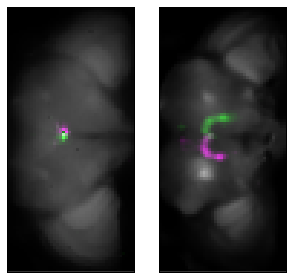

In [349]:
pylab.rcParams['figure.figsize'] = (5, 5)

N=2

Df=np.zeros([S[0],S[1],3]) 


for i in range(N):
        plt.subplot(1,N,i+1)
        if i==0:
            for l in range(3):
                Df[:,:,l]=np.mean(Final_map[:,:,0:3,l],2)*2+np.mean(Dmean[:,:,0:4],2)/10
            plt.imshow(Df,cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
            Df=np.zeros([S[0],S[1],3]) 
        else:
            for l in range(3):
                Df[:,:,l]=Final_map[:,:,4,l]*0.8+Dmean[:,:,4]/10
            plt.imshow(Df,cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
plt.show()
                                    

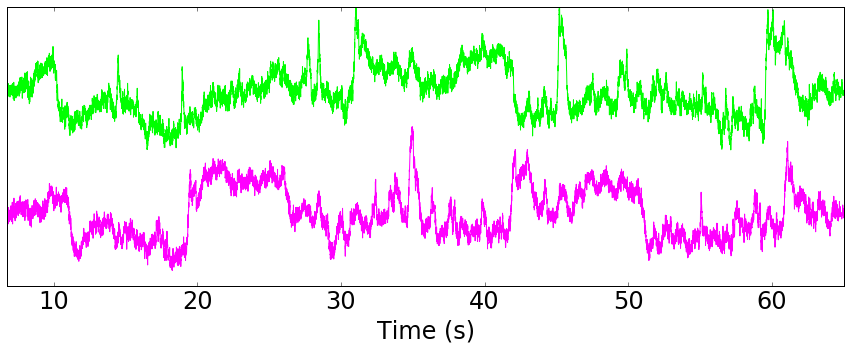

In [350]:
pylab.rcParams['figure.figsize'] = (15, 5)
h=5
i=0

for j in range(S[3]):
    if Good_ICs[j]:
        plt.plot(Time_fluo,(DT[:,Order[j]]/np.sqrt(np.var(DT[:,Order[j]]))+h*i),color=C[j,:])
        i=i+1
plt.xlim([np.min(Time_fluo),np.max(Time_fluo)])
plt.ylim([-3,8.5])
frame1=plt.gca()
frame1.axes.get_yaxis().set_ticks([])
matplotlib.rcParams.update({'font.size': 24})
plt.xlabel('Time (s)')
plt.show()

In [ ]:
pylab.rcParams['figure.figsize'] = (15, 5)
h=5
i=0

for j in range(S[3]):
    if Good_ICs[j]:
        plt.plot(Time_fluo,(DT[:,Order[j]]/np.sqrt(np.var(DT[:,Order[j]]))+h*i),color=C[j,:])
        i=i+1
plt.xlim([np.min(Time_fluo),np.max(Time_fluo)])
plt.ylim([-3,8.5])
frame1=plt.gca()
frame1.axes.get_yaxis().set_ticks([])
matplotlib.rcParams.update({'font.size': 24})
plt.xlabel('Time (s)')
plt.show()